# Hypothesis Testing with Mixed Effects: Exploring the Impact of Average Temperature on Walmart's Weekly Sale

## 1. Introduction<a id='introduction'></a>

This project is based on the **Walmart Sales Dataset** obtained from Kaggle, which provides information about the weekly sales of 45 Walmart stores for the years 2010-2012. The dataset includes various factors such as holidays, temperature, fuel price, CPI, and unemployment, allowing us to explore the relationship between these factors and weekly sales.

### Dataset Overview

Walmart Inc. is a multinational retail corporation that operates a chain of hypermarkets, discount department stores, and grocery stores in the United States and other countries. The dataset includes weekly sales data from 45 Walmart stores, along with additional information such as holidays, average temperature, fuel price, CPI, and unemployment. The dataset has been compiled by [Varsha Ramakrishnan](https://www.kaggle.com/varsharam) and made available on Kaggle.

#### Columns:
* **Store** : 
Store Numbers ranging from 1 to 45

* **Date** : 
The Week of Sales. It is in the format of dd-mm-yyyy. The date starts from 05-02-2010

* **Weekly_Sales** : 
The sales of the given store in the given week

* **Holiday_Flag** : 
If the week has a special Holiday or not. 1-The week has a Holiday 0-Fully working week Holiday events is given in the description.

* **Temperature** : 
Average Temperature of the week of sales

* **Fuel_Price** : 
Price of the Fuel in the region of the given store

* **CPI** : 
Customer Price Index

* **Unemployment** : 
Unemployment of the given store region


### Objectives

The main objective of this project is to investigate whether there is a correlation between the average temperature and weekly sales in Walmart stores. We aim to test the hypothesis that average temperature influences the weekly sales performance. The null hypothesis states that there is no correlation between average temperature and weekly sales.

### Methodology

To test the hypothesis, we will employ a mixed-effects modeling approach using the `statsmodels` library in Python. Mixed-effects models allow us to account for the random effects of different stores, considering the potential variation between stores in the relationship between temperature and weekly sales.

### Project Steps

These are the general steps that we will follow in this project. The [contents](#contents) section highlights all the sections involved.

1. Data Preprocessing: We will start by loading and preprocessing the dataset, checking for missing values, and ensuring the data is in the correct format.

2. Data Exploration: We will perform exploratory data analysis to gain insights into the distribution and summary statistics of the variables, as well as visualize the relationships between temperature and weekly sales.

3. Hypothesis Testing: We will formulate the research and null hypotheses related to the correlation between average temperature and weekly sales. Then, we will fit a mixed-effects model using the `MixedLM` function in `statsmodels` to test the hypothesis.

4. Model Assessment: We will assess the goodness of fit of the mixed-effects model by examining model diagnostics, evaluating performance metrics, and checking the assumptions of the model.

5. Interpretation and Reporting: Based on the results of the hypothesis testing, we will interpret the estimated coefficients, assess their statistical significance, and provide conclusions regarding the correlation between average temperature and weekly sales.

## 2. Contents

1. [Introduction](#introduction)
2. [Contents](#contents)
3. [Data Preprocessing](#data-preprocessing)
    1. [Libraries](#libraries)
    2. [Summary Stats](#summary-stats)
4. [Data Exploration](#data-exploration)
    1. [Shape of Data](#shape-data)
    2. [Weekly Sales](#weekly-sales)
    3. [Temperature](#temperature)
    4. [Temperature and Weekly Sales](#temperature-sales)
    5. [Holidays](#holidays)
    6. [Fuel Price](#fuel-price)
    7. [Customer Price Index (CPI)](#cpi)
    8. [Unemployment](#unemployment)
    9. [Checking for Multicollinearity](#multicollinearity)
5. [Hypothesis](#hypotheis)
6. [Statistical Analysis](#statistical-analysis)
    1. [Feature Selection](#feature-selection)
    2. [Model Selection](#model-selection)
        [Null Hypothesis Model](#null-model)
        [Pool Regression Model](#pool-model)
        [Mixed Effects Model](#mixed-model)
7. [Model Assessment](#model-assessment)
    1. [Goodness of fit](#fit-goodness)
    2. [Model Diagnostics](#model-diagnostics)
        1. [Residual Analysis for all Stores](#residual-analaysis-all-stores)
        2. [Residual Analysis for each Store](#residual-analysis-each-store)
    3. [Model Assumptions - Interpretation of  the plots](#'model-assumptions)
8. [Interpretation of Results](#interpreting-results)
    1. [Coefficients Interpretation](#coefficients-interpretation)
    2. [P-Values](#pvalues-interpretation)
9. [Performance Metrics Evaluation](#perfomrance-metrics)
    1. [R-Squared value](#rsquare)
    2. [Adjusted R-Squared value](#adjusted-rsquare)
    3. [Mean Squared Error (MSE) and Root Mean Squared Error (MSE)](#rmse)
10. [Sensitivity Analysis](#sensitivity-analysis)
11. [Impact of Outliers](#outliers-impact)
12. [Conclusion](#conclusion)
13. [Acknowledgements](#acknowledgements)


## 3. Data Preprocessing<a id='data-preprocessing'></a>
We load the data and check it, to ensure it is suitable for analysis. We can check for missing values, outliers, and inconsistencies.

### A. Libraries<a id='libraries'></a>

In [1]:
# Basic 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [2]:
# Load data to Pandas Dataframe
filename = []
for folder in os.listdir('/kaggle/input'):
    for file in os.listdir(f'/kaggle/input/{folder}'):
        filename.append(f'/kaggle/input/{folder}/{file}')

if len(filename)==1:
    if len(filename[0].split(".csv")) > 1:
        data = pd.read_csv(filename[0])
        print("File loaded from '{}'".format(filename[0].split("/")[-1]))
    else:
        print("No CSV file found")
else:
    print("Multiple files found")

File loaded from 'walmart-sales-dataset-of-45stores.csv'


In [3]:
# First 5 rows of the imported data
data.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


### B. Summary Stats<a id='summary-stats'></a>
We try to understand the details of the data to correct missing values, outliers, or any other inconsistenices that may be present.

In [4]:
print("Number of observations: {}".format(data.shape[0]))
print("Number of features: {}".format(data.shape[1]))

print("Memory Usage: {}+ MB".format(round((data.memory_usage()/1024/1024).sum(), 1)))

Number of observations: 6435
Number of features: 8
Memory Usage: 0.4+ MB


In [5]:
column_types=pd.DataFrame(data.dtypes, columns=['data_type']).T
column_types

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
data_type,int64,object,float64,int64,float64,float64,float64,float64


We can convert the Data feature from `object` to `datetime` data type.

In [6]:
# Convert Date feature from 'Object' to 'Datetime' data type
data['Date'] = pd.to_datetime(data['Date'], format='%d-%m-%Y')
column_types=pd.DataFrame(data.dtypes, columns=['data_type']).T
column_types

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
data_type,int64,datetime64[ns],float64,int64,float64,float64,float64,float64


In [7]:
data.select_dtypes(include = ['int', 'float']).describe()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
std,12.988182,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885
min,1.000000,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000


In [8]:
data.select_dtypes('datetime').describe(datetime_is_numeric=True)

,Date
count,6435
mean,2011-06-17 00:00:00
min,2010-02-05 00:00:00
25%,2010-10-08 00:00:00
50%,2011-06-17 00:00:00
75%,2012-02-24 00:00:00
max,2012-10-26 00:00:00


In [9]:
# Number of unique values in Data
data.nunique()

Store             45
Date             143
Weekly_Sales    6435
Holiday_Flag       2
Temperature     3528
Fuel_Price       892
CPI             2145
Unemployment     349
dtype: int64

In [10]:
# Percentage of null values in each feature
data.isnull().mean()*100

Store           0.0
Date            0.0
Weekly_Sales    0.0
Holiday_Flag    0.0
Temperature     0.0
Fuel_Price      0.0
CPI             0.0
Unemployment    0.0
dtype: float64

There are no missing data

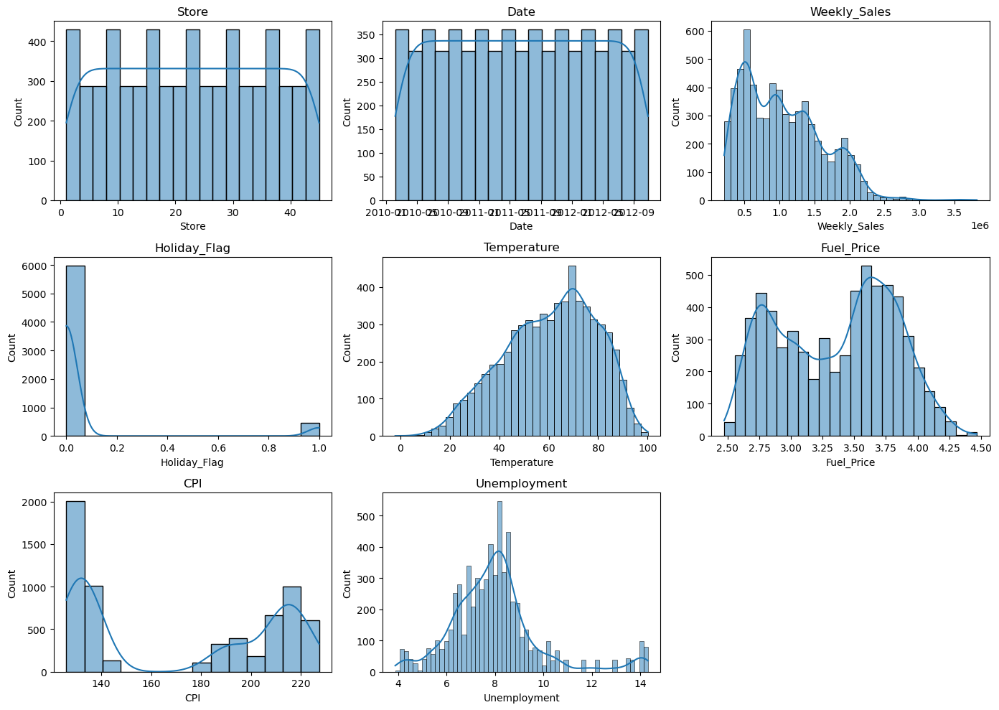

In [11]:
# Histogram plot of all features:
nrows = len(data.columns)//3 +1
ncols = 3

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 10))

axes=axes.flatten()

for i,col in enumerate(data.columns):
    sns.histplot(data=data, x=col, kde=True, ax=axes[i])
    axes[i].set_title(col)

for i in range(len(data.columns), nrows*ncols):
    axes[i].axis('off')

plt.tight_layout()

plt.show()

Since the data contains Random effects as the sales represent different stores at different regions, we cannot directly check for outliers in teh data.

Since the data contains details for stores from multiple regions we cannot consider the outliers directly as the features are different for different regions.
We can therefore proceed with data exploration with respect to different stores.

## 4. Data Exploration<a id='data-exploration'></a>
We conduct Exploratory Data Analysis to discover underlying patterns in the data.

### A. Shape of Data<a id='shape-data'></a>

In [12]:
# We can check the number of observations available per store
pd.DataFrame(data.groupby("Store")['Store'].agg('count')).T

Store,1,2,3,4,5,6,7,8,9,10,...,36,37,38,39,40,41,42,43,44,45
Store,143,143,143,143,143,143,143,143,143,143,...,143,143,143,143,143,143,143,143,143,143


Each store has the same number of observations. In addition we have already seen that there are 143 unique dates in the dataframe. This means that the obserations record the weekly sales for all 45 stores on the same date.

<Axes: xlabel='Store', ylabel='count'>

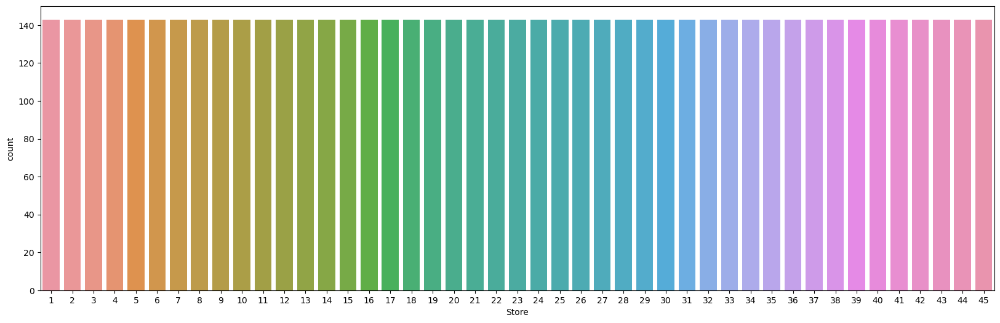

In [13]:
plt.figure(figsize=(20, 6))
sns.countplot(data=data, x='Store')

### B. Weekly Sales<a id='weekly-sales'></a>

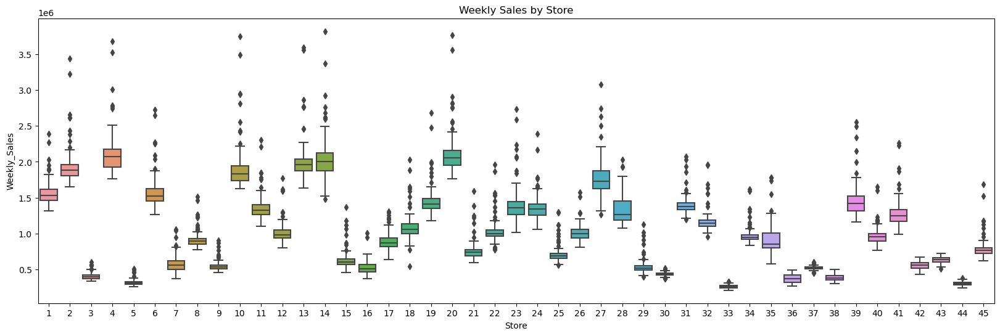

In [14]:
# Weekly sales per store
plt.figure(figsize=(20, 6))
plt.title('Weekly Sales by Store')
sns.boxplot(data=data, x='Store', y='Weekly_Sales')
plt.show()

In [15]:
statistics = ["mean", "std", "min"]
quantiles = [0.01, 0.05, 0.1, 0.3, 0.6, 0.9, 0.95, 0.99]
rename_quantiles = {0.01 : '1%',
                    0.05 : '5%',
                    0.1 : '10%',
                    0.3 : '30%',
                    0.6 : '60%',
                    0.9 : '90%',
                    0.95 : '95%',
                    0.99 : '99%'
                   }
store_summary = data.groupby('Store')['Weekly_Sales'].agg(statistics)
for quantile in quantiles:
    store_summary = pd.concat([store_summary,data.groupby('Store')['Weekly_Sales'].agg(lambda x: x.quantile(quantile)).rename("{}".format(rename_quantiles[quantile]))], axis = 1)

store_summary.insert(8, 'median', data.groupby('Store')['Weekly_Sales'].agg("median"))
store_summary['max'] = data.groupby('Store')['Weekly_Sales'].agg("max")
print("Summary stats, values x10^5")
display((store_summary/100000).applymap('{:.2f}'.format))

Summary stats, values x10^5


,mean,std,min,1%,5%,10%,30%,60%,median,90%,95%,99%,max
Store,,,,,,,,,,,,,
1,15.55,1.56,13.17,13.23,13.73,13.95,14.79,15.54,15.35,16.86,18.18,21.71,23.88
2,19.26,2.38,16.50,16.64,17.13,17.46,18.25,19.14,18.79,21.03,22.81,29.87,34.36
3,4.03,0.46,3.40,3.42,3.49,3.53,3.75,4.08,3.95,4.61,4.76,5.62,6.06
4,20.95,2.66,17.63,17.96,18.17,18.59,19.67,21.04,20.74,22.45,24.66,33.07,36.76
5,3.18,0.38,2.61,2.69,2.78,2.83,2.97,3.17,3.10,3.53,3.68,4.79,5.08
6,15.65,2.13,12.61,12.80,13.26,13.53,14.81,15.59,15.24,17.09,18.74,24.86,27.28
7,5.71,1.13,3.73,3.83,4.11,4.58,5.09,5.78,5.57,6.93,7.29,10.05,10.60
8,9.09,1.06,7.73,7.74,7.89,8.15,8.64,9.06,8.93,9.93,10.69,13.78,15.12
9,5.44,0.69,4.53,4.54,4.64,4.80,5.12,5.45,5.37,6.05,6.56,8.49,9.05


We can see that the range of weekly sales for different stores differ widely, so it wouldn't be right to remove outliers for the overall data as it differs for different stores.
But it is difficult to understand if the sales correspond to putliers as it could be the result of extraordinary sales in a particular week, perhaps due to a holiday or event.

In [16]:
store_summary['mean'].agg('std')/100000

5.466262691782535

This implies there is a significant variability in the dispersion of weekly sales across the different stores, as seen in the plot

### C. Temperature<a id='temperature'></a>

The pattern only shows the general seasonal rise and fall in tempperature. Without geographic cordinates for the stores it is difficult for us to learn other patterns. Some regions don't get temperatures below 0&deg;C, while other regions don't go below 15&deg;C in winter. This also could possibly mean that sales could drop in hot weathers for stores in hotter regions, while, it drops during winters for stores in colder regions. This could also imply that a common slope with multiple intercepts may fail to capture the relationship between sales and temperature.

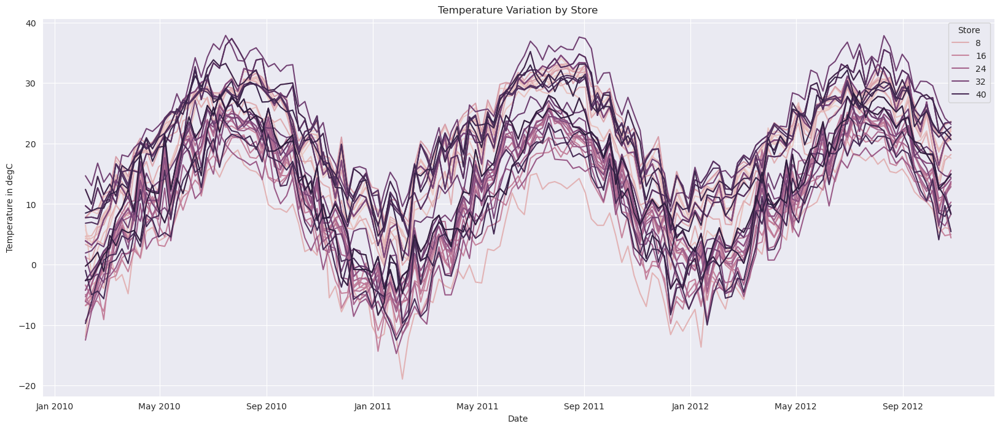

In [17]:
import matplotlib.dates as mdates
# Set the style for the plot
plt.figure(figsize=(20, 8))
sns.set_style("darkgrid")

# COnvert data from Fahrenheit to Celcius scale
degC = (data['Temperature']-32)*5/9

# Create the line plot
ax=sns.lineplot(data=data, x='Date', y=degC, hue='Store')

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Temperature in degC')
plt.title('Temperature Variation by Store')

# Format x-axis labels to show only month and year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

# Display the plot
plt.show()

In [18]:
# For analysis we can create and expanded dataframe with more features.

data_exp = data.copy()
data_exp['Temp_degC']=(data_exp['Temperature']-32)*5/9
data_exp['Week'] = data_exp['Date'].dt.isocalendar().week
data_exp['Month'] = data_exp['Date'].dt.month
data_exp['Year'] = data_exp['Date'].dt.year

In [19]:
data_exp.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Temp_degC,Week,Month,Year
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,5.727778,5,2,2010
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,3.616667,6,2,2010
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,4.405556,7,2,2010
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,8.127778,8,2,2010
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,8.055556,9,3,2010


### D. Temperature and Weekly Sales<a id='temperature-sales'></a>

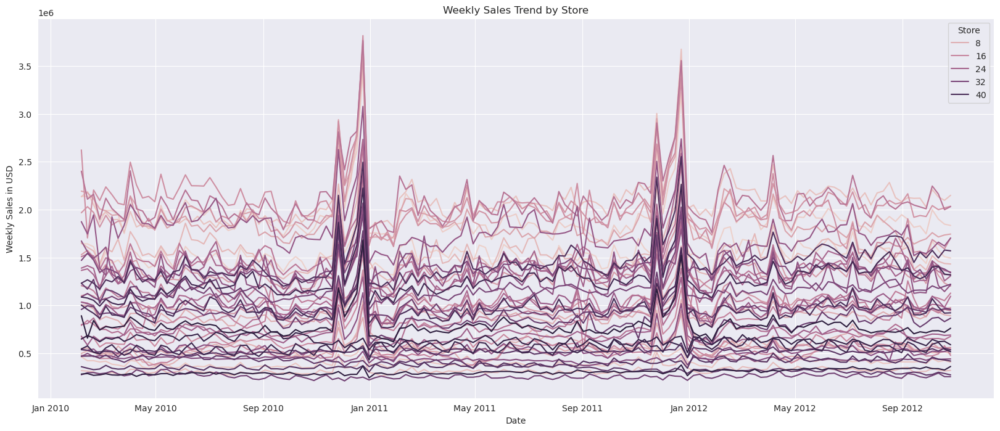

In [20]:
# Set the style for the plot
plt.figure(figsize=(20, 8))
sns.set_style("darkgrid")

# Create the line plot
ax=sns.lineplot(data=data_exp, x='Date', y='Weekly_Sales', hue='Store')

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Weekly Sales in USD')
plt.title('Weekly Sales Trend by Store')

# Format x-axis labels to show only month and year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

# Display the plot
plt.show()

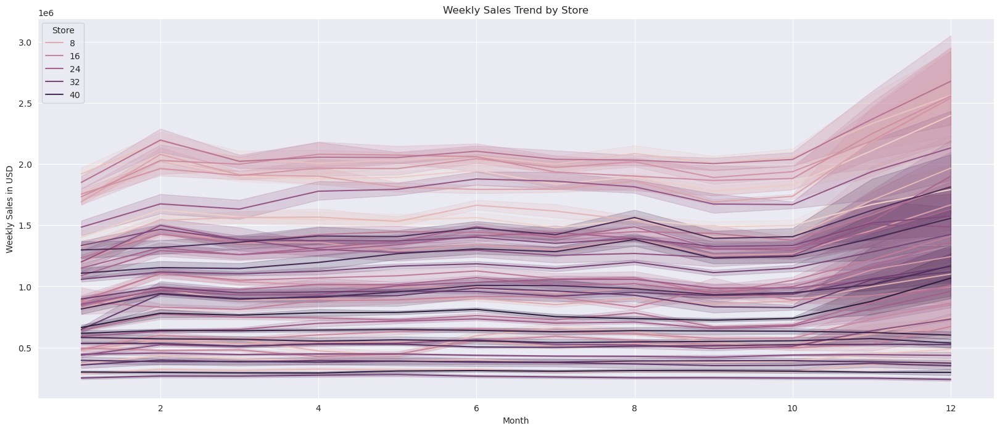

In [21]:
# Set the style for the plot
plt.figure(figsize=(20, 8))
sns.set_style("darkgrid")

# Create the line plot
ax=sns.lineplot(data=data_exp, x='Month', y='Weekly_Sales', hue='Store')

# Set labels and title
plt.xlabel('Month')
plt.ylabel('Weekly Sales in USD')
plt.title('Weekly Sales Trend by Store')

# Display the plot
plt.show()

Most stores seem to have higher sales during December, but not all. Some of the stores have relatively steady sales throughtout the year, with some having a slight dip towards th end of the year. It is interesting to note that the stores with higher sales show higher fluctuations througout the year while stores with lower sales have comparitively lower fluctuations. We see this in the standard devaiations as well. Stores with high mean sales show larger deviation in other statistics.

We will have to explore this in more detail.

In [22]:
print("Stores with highest average sales (all values x10^5):")
display((store_summary.sort_values('mean', ascending=False)/100000)
        .applymap('{:.2f}'.format).head())
print("Stores with lowest average sales (all values x10^5):")
display((store_summary.sort_values('mean', ascending=False)/100000)
        .applymap('{:.2f}'.format).tail())

Stores with highest average sales (all values x10^5):


,mean,std,min,1%,5%,10%,30%,60%,median,90%,95%,99%,max
Store,,,,,,,,,,,,,
20,21.08,2.76,17.61,17.70,18.60,18.92,19.74,20.92,20.53,23.44,25.63,32.83,37.67
4,20.95,2.66,17.63,17.96,18.17,18.59,19.67,21.04,20.74,22.45,24.66,33.07,36.76
14,20.21,3.18,14.80,15.32,15.92,16.50,18.87,20.57,20.04,22.71,25.84,31.81,38.19
13,20.04,2.66,16.34,16.78,17.70,18.13,18.93,19.97,19.59,21.40,24.42,32.66,35.96
2,19.26,2.38,16.50,16.64,17.13,17.46,18.25,19.14,18.79,21.03,22.81,29.87,34.36


Stores with lowest average sales (all values x10^5):


,mean,std,min,1%,5%,10%,30%,60%,median,90%,95%,99%,max
Store,,,,,,,,,,,,,
38,3.86,0.43,3.04,3.22,3.31,3.36,3.56,3.99,3.81,4.38,4.68,4.91,4.99
36,3.74,0.61,2.71,2.74,2.88,3.00,3.29,3.94,3.73,4.65,4.71,4.85,4.89
5,3.18,0.38,2.61,2.69,2.78,2.83,2.97,3.17,3.10,3.53,3.68,4.79,5.08
44,3.03,0.25,2.42,2.60,2.70,2.76,2.86,3.07,2.98,3.38,3.42,3.63,3.76
33,2.60,0.24,2.10,2.14,2.25,2.32,2.45,2.64,2.58,2.91,3.02,3.26,3.31


In [23]:
# Group the data by store and year:
sales_summary = data_exp.groupby(["Store", "Year"])['Weekly_Sales'].agg(['max', 'min'])
# sales_summary.head()

# Get Highest and Lowest sale for each year
pivot_sales = sales_summary.pivot_table(index='Store', columns='Year', values=['max', 'min'])
pivot_sales.columns = pivot_sales.columns.swaplevel(0, 1).set_levels(['Highest_Sale', 'Lowest_Sale'], level=1)
# pivot_sales.head()

# Get Month with Highest and Lowest sale for each year
replace_dict = dict(zip(data_exp['Weekly_Sales'], data_exp['Month']))
sales_month_summary = pivot_sales.replace(replace_dict)
sales_month_summary.columns = sales_month_summary.columns.set_levels(['HS_Month', 'LS_Month'], level=1)
# sales_month_summary.head()

# Combine both
sales_year_summary = pd.concat([pivot_sales, sales_month_summary], axis=1).sort_index(axis=1, level=0)
sales_year_summary

Year      2010                                       2011               \
      HS_Month Highest_Sale LS_Month Lowest_Sale HS_Month Highest_Sale   
Store                                                                    
1         12.0   2387950.20     10.0  1345454.00     12.0   2270188.99   
2         12.0   3436007.68      9.0  1724557.22     12.0   3224369.80   
3         12.0    605990.41      8.0   339597.38     11.0    556925.19   
4         12.0   3526713.39      3.0  1762539.30     12.0   3676388.98   
5         11.0    488362.61      7.0   268929.03     11.0    507900.07   
6         12.0   2727575.18      9.0  1275591.84     12.0   2644633.02   
7         12.0   1045124.88      5.0   372673.61     12.0   1059715.27   
8         12.0   1511641.09      3.0   772539.12     12.0   1462254.05   
9         12.0    873347.55      9.0   452905.22     12.0    905324.68   
10        12.0   3749057.69     10.0  1645892.97     12.0   3487986.89   
11        12.0   2306265.36     10.0  1169831.38     12.0   2213518.50   
12        12.0   1768249.89     10.0   850936.26     12.0   1617612.03   
13        12.0   3595903.20     12.0  1675292.00     12.0   3556766.03   
14        12.0   3818686.45     12.0  1623716.46     12.0   3369068.99   
15        12.0   1368318.17     12.0   543754.17     12.0   1182691.87   
16        12.0   1004730.69      4.0   370230.94     12.0    950691.96   
17        12.0   1309226.79     12.0   635862.55     12.0   1289156.90   
18        12.0   2027507.15     12.0   887907.01     12.0   1882393.40   
19        12.0   2678206.42     12.0  1275146.94     12.0   2480159.47   
20        12.0   3766687.43      9.0  1789687.65     12.0   3555371.03   
21        12.0   1587257.78      9.0   671688.06     12.0   1384552.17   
22        12.0   1962445.04     12.0   774262.28     12.0   1863195.68   
23        12.0   2734277.10      9.0  1099055.65     12.0   2587953.32   
24        12.0   2386015.75      2.0  1158722.74     12.0   2168344.23   
25        12.0   1295391.19      2.0   583364.02     12.0   1290532.97   
26        12.0   1573982.47      2.0   855385.01     12.0   1515175.01   
27        12.0   3078162.08      3.0  1313729.72     12.0   2739019.75   
28        12.0   2026026.39     12.0  1090558.57     11.0   1929738.27   
29        12.0   1130926.79      9.0   463752.89     12.0   1016637.39   
30        12.0    519354.88     12.0   397631.02     12.0    492022.68   
31        12.0   2068942.97     12.0  1198071.60     12.0   2026176.14   
32        12.0   1949183.14     12.0   955463.84     12.0   1959526.96   
33         5.0    331173.51     12.0   209986.25      9.0    281842.28   
34        12.0   1620748.25      8.0   855421.39     12.0   1593655.96   
35        11.0   1781866.98     12.0   576332.05     11.0   1733822.40   
36         5.0    489372.02     12.0   359310.65      3.0    431412.22   
37        12.0    576809.92      3.0   460020.74     12.0    605791.46   
38         5.0    383657.44     12.0   303908.81     10.0    449516.29   
39        12.0   2495489.25      2.0  1168582.02     12.0   2554482.84   
40        12.0   1648829.18     12.0   811318.30     12.0   1601585.70   
41        12.0   2225016.73      2.0   991941.73     12.0   2263722.68   
42         6.0    607218.60     12.0   428953.60     10.0    649111.23   
43         9.0    725043.04     12.0   534740.30      5.0    684655.91   
44        12.0    365098.24     12.0   241937.11     12.0    376233.89   
45        12.0   1682862.03      2.0   656988.64     12.0   1521957.99   

Year                           2012                                    
      LS_Month Lowest_Sale HS_Month Highest_Sale LS_Month Lowest_Sale  
Store                                                                  
1          1.0  1316899.31      4.0   1899676.88      1.0  1319325.59  
2          9.0  1650394.44      2.0   2196688.46      1.0  1660906.14  
3          7.0   345381.29      4.0    503232.13      1.0   349518.10  
4          1.0 

In [24]:
# # ALTERNATIVE METHOD with same Output (Works even if all sales values aren't unique):
# # Group by store_number and find the max weekly_sales
# max_sales = data_exp.groupby(['Store', 'Year'])['Weekly_Sales'].max()
# min_sales = data_exp.groupby(['Store', 'Year'])['Weekly_Sales'].min()
# # display(max_sales.head())
# # display(min_sales.head())

# # Merge with original data to get corresponding month
# max_sales = pd.merge(data_exp[['Store', 'Weekly_Sales', 'Month', 'Year']], max_sales, 
#                      on=['Store', 'Weekly_Sales']).rename(columns = {'Weekly_Sales':'Highest_Sale', 'Month':'HS_Month'})
# min_sales = pd.merge(data_exp[['Store', 'Weekly_Sales', 'Month', 'Year']], min_sales, 
#                      on=['Store', 'Weekly_Sales']).rename(columns = {'Weekly_Sales':'Lowest_Sale', 'Month':'LS_Month'})
# # display(max_sales.head())
# # display(min_sales.head())

# hl_sales_data = pd.merge(max_sales, min_sales, on=['Store', 'Year']).set_index(['Store', 'Year'])
# sales_year_summary=hl_sales_data.pivot_table(index='Store', columns='Year', values=['Highest_Sale', 'HS_Month', 'Lowest_Sale', 'LS_Month'])
# # sales_year_summary.head()

# sales_year_summary.columns = sales_year_summary.columns.swaplevel(0, 1)
# # sales_year_summary.head()

# sales_year_summary = sales_year_summary.sort_index(axis=1, level=0)
# sales_year_summary

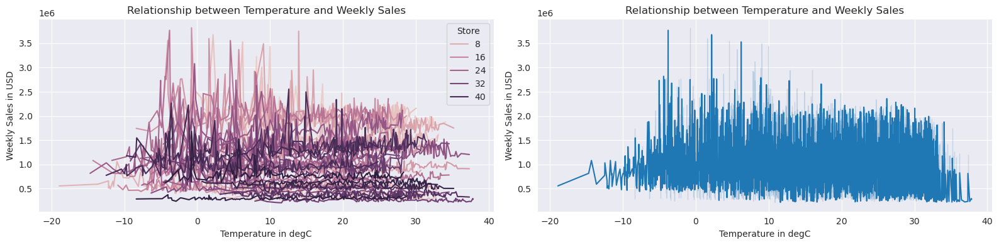

In [25]:
plt.figure(figsize=(16, 4))

# Line plot 1
plt.subplot(1, 2, 1)
ax=sns.lineplot(data=data_exp, x='Temp_degC', y='Weekly_Sales', hue='Store')

# Set labels and title
plt.xlabel('Temperature in degC')
plt.ylabel('Weekly Sales in USD')
plt.title('Relationship between Temperature and Weekly Sales')

# Line plot 2
plt.subplot(1, 2, 2) 
ax=sns.lineplot(data=data_exp, x='Temp_degC', y='Weekly_Sales')

# Set labels and title
plt.xlabel('Temperature in degC')
plt.ylabel('Weekly Sales in USD')
plt.title('Relationship between Temperature and Weekly Sales')


# Adjust the layout
plt.tight_layout()

# Display the plots
plt.show()

It is hard to percieve a useful pattern between temperature and weekly sales from the above plots

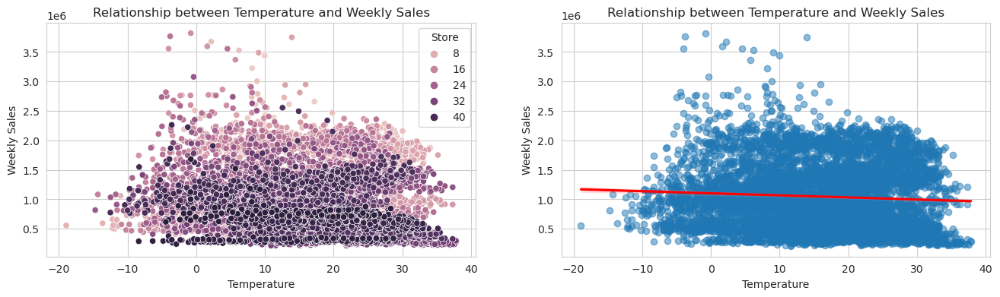

In [26]:
plt.figure(figsize=(16, 4))
sns.set_style("whitegrid")

# Scatter plot
plt.subplot(1, 2, 1)  # 1 row, 2 columns, subplot 1
sns.scatterplot(data=data_exp, x='Temp_degC', y='Weekly_Sales', hue='Store')

# Set labels and title
plt.xlabel('Temperature')
plt.ylabel('Weekly Sales')
plt.title('Relationship between Temperature and Weekly Sales')

sns.set_style("whitegrid")

# Regression plot
plt.subplot(1, 2, 2)  # 1 row, 2 columns, subplot 2
sns.regplot(data=data_exp, x='Temp_degC', y='Weekly_Sales', scatter_kws={'alpha':0.5}, line_kws={'color':'red'})

# Set labels and title
plt.xlabel('Temperature')
plt.ylabel('Weekly Sales')
plt.title('Relationship between Temperature and Weekly Sales')


# Display the plot
plt.show()

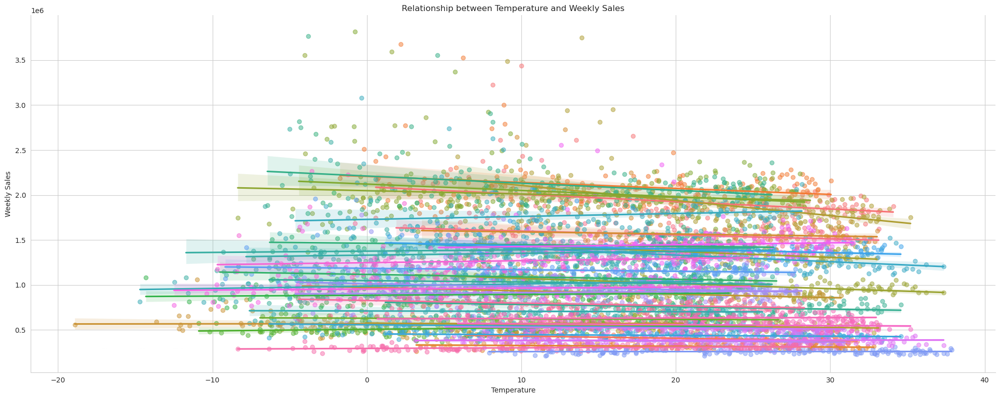

In [27]:
sns.set_style("whitegrid")

# Regression plot
sns.lmplot(x='Temp_degC', y='Weekly_Sales', hue='Store', data=data_exp, scatter_kws={'alpha':0.5}, legend = False, height = 8, aspect =2.5)

# Set labels and title
plt.xlabel('Temperature')
plt.ylabel('Weekly Sales')
plt.title('Relationship between Temperature and Weekly Sales')
# Display the plot
plt.show()

This shows that stores with higher sales are more affected by temperature compared to the ones with lower sales overall. We have seen this above with the Weekly Sales plots. We also observe that the temperature range is different for different stores when considering their Weekly Sales. Stores with low weekly sales come from regions with hot as well as cold weathers. Regions with moderate temperature changes seem to have higher sales. This needs to be investigated further.

### E. Holidays<a id='holidays'></a>

Number of holidays in data: 10.0


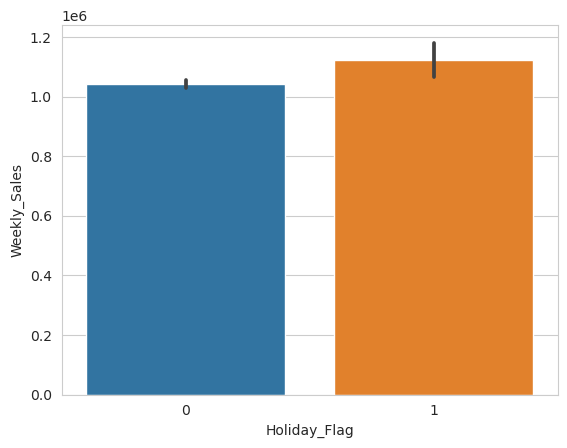

In [28]:
# Mean sales on holidays vs other days
print("Number of holidays in data: {}".format(data.Holiday_Flag.sum()/45) )
sns.barplot(x='Holiday_Flag', y='Weekly_Sales', data=data)
plt.show()

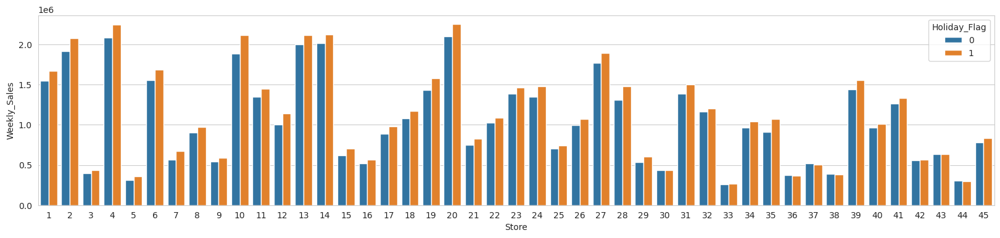

In [29]:
plt.figure(figsize=(20, 4))  # Adjust the figure size if needed
sns.barplot(data=data, x='Store', y='Weekly_Sales', hue='Holiday_Flag', errorbar=None)
plt.show()

Except for very for, Store nos. 30, 36, 38, and 44 all stores show a higher average sale during holiday weeks. These stores are also among those those with low overall weekly sales. These could be areas where a physical Walmart store is less popular compared to alternatives.

### F. Fuel Price<a id='fuel-price'></a>

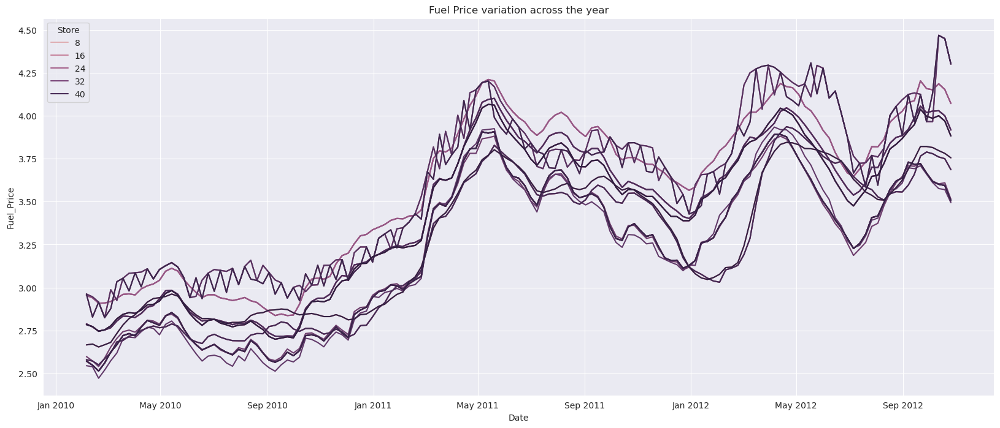

In [30]:
plt.figure(figsize=(20, 8))
sns.set_style("darkgrid")

# Create the line plot
ax=sns.lineplot(data=data, x='Date', y='Fuel_Price', hue='Store')

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Fuel_Price')
plt.title('Fuel Price variation across the year')

# Format x-axis labels to show only month and year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

plt.show()

Lets add another feature to data_exp which gives an order to the stores based on overal mean of weekly sales. With 1 having the highest mean sale and 45 having the lowest. This will allow us to check if sales differ for regions with different fuel prices, as they are usually far off from each other. Regions with similar fuel prices hae a chance of being closer together geopgraphically.

In [31]:
mean_sales_sorted = store_summary.sort_values('mean', ascending=False).reset_index()[['Store', 'mean']]
mean_sales_sorted['Store_Rank']=range(1, len(mean_sales_sorted)+1)
data_exp = pd.merge(data_exp, mean_sales_sorted[['Store', 'Store_Rank']], on='Store')
data_exp.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Temp_degC,Week,Month,Year,Store_Rank
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,5.727778,5,2,2010,9
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,3.616667,6,2,2010,9
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,4.405556,7,2,2010,9
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,8.127778,8,2,2010,9
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,8.055556,9,3,2010,9


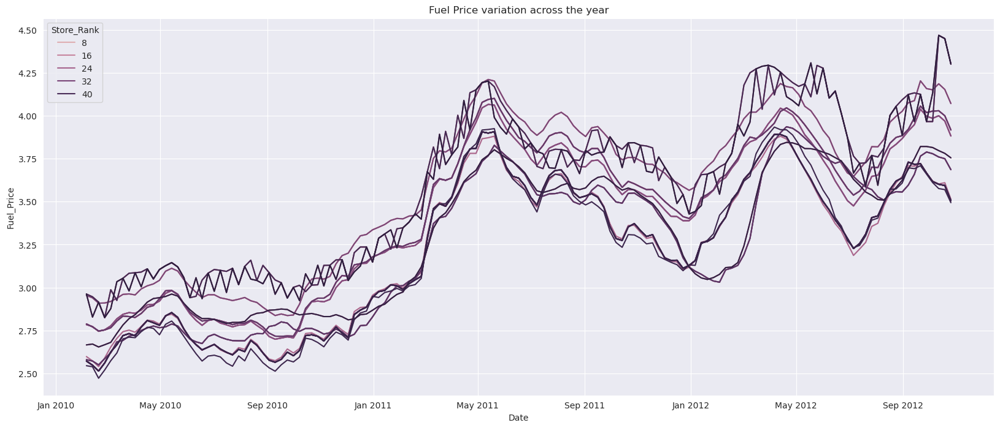

In [32]:
plt.figure(figsize=(20, 8))
sns.set_style("darkgrid")

# Create the line plot
ax=sns.lineplot(data=data_exp, x='Date', y='Fuel_Price', hue='Store_Rank')

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Fuel_Price')
plt.title('Fuel Price variation across the year')

# Format x-axis labels to show only month and year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

plt.show()

There is no specific trend that emerges and regions with similar fuel prices can have stores performing better or worse.

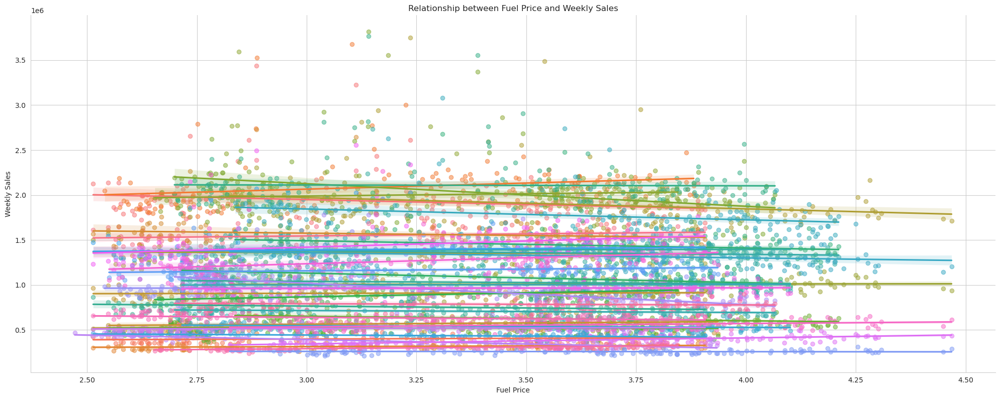

In [33]:
sns.set_style("whitegrid")

# Regression plot
sns.lmplot(x='Fuel_Price', y='Weekly_Sales', hue='Store', data=data_exp, scatter_kws={'alpha':0.5}, legend = False, height = 8, aspect =2.5)

# Set labels and title
plt.xlabel('Fuel Price')
plt.ylabel('Weekly Sales')
plt.title('Relationship between Fuel Price and Weekly Sales')

# Display the plots
plt.show()

Except for a few regions, no apparent relationship can be seen between Fuel Price and Weekly Sales

### G. Customer Price Index (CPI)<a id='cpi'></a>

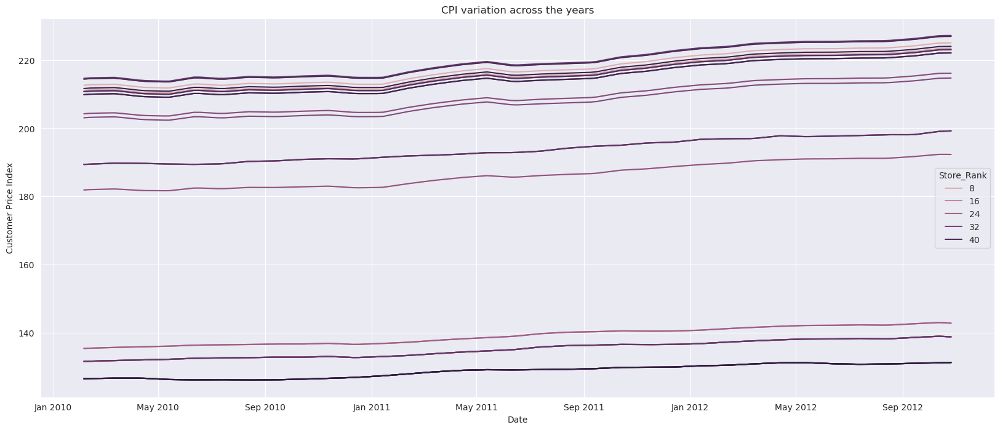

In [34]:
plt.figure(figsize=(20, 8))
sns.set_style("darkgrid")

# Create the line plot
ax=sns.lineplot(data=data_exp, x='Date', y='CPI', hue='Store_Rank')

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Customer Price Index')
plt.title('CPI variation across the years')

# Format x-axis labels to show only month and year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

plt.show()

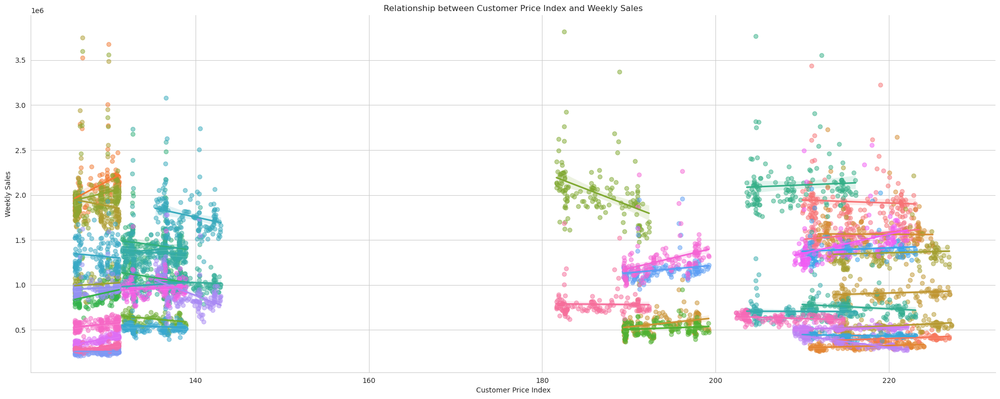

In [35]:
sns.set_style("whitegrid")

# Regression plot
sns.lmplot(x='CPI', y='Weekly_Sales', hue='Store', data=data_exp, scatter_kws={'alpha':0.5}, legend = False, height = 8, aspect =2.5)

# Set labels and title
plt.xlabel('Customer Price Index')
plt.ylabel('Weekly Sales')
plt.title('Relationship between Customer Price Index and Weekly Sales')

# Display the plots
plt.show()

The first plot shows that CPI increases with a similar slope across different regions. The second plot shows that in different regions the CPI affects the sales differently. This can arise due to other factors in market and the mindset of the cutomers of a particular region in general. For example, a certain group might see particult time as better to invest than for spending.

One clear indication the plots show is the presence of different markets. It shows that there are regions with similar CPI ranges and these groups can vary widely with other groups.

### H. Unemployment<a id='unemployment'></a>

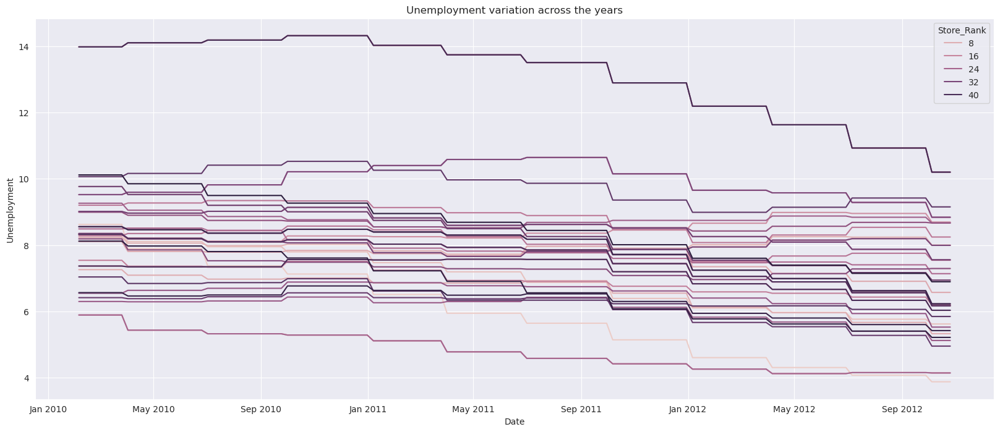

In [36]:
plt.figure(figsize=(20, 8))
sns.set_style("darkgrid")

# Create the line plot
ax=sns.lineplot(data=data_exp, x='Date', y='Unemployment', hue='Store_Rank')

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Unemployment')
plt.title('Unemployment variation across the years')

# Format x-axis labels to show only month and year
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

plt.show()

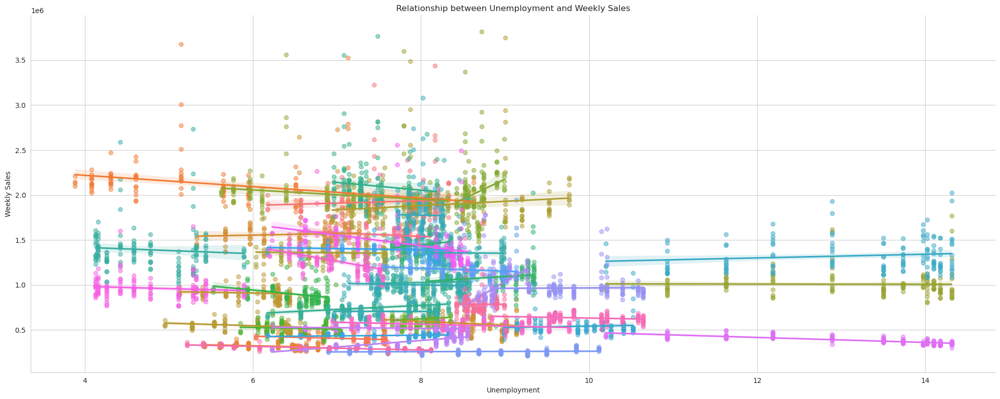

In [37]:
sns.set_style("whitegrid")

# Regression plot
sns.lmplot(x='Unemployment', y='Weekly_Sales', hue='Store', data=data_exp, scatter_kws={'alpha':0.5}, legend = False, height = 8, aspect =2.5)

# Set labels and title
plt.xlabel('Unemployment')
plt.ylabel('Weekly Sales')
plt.title('Relationship between Unemployment and Weekly Sales')

# Display the plots
plt.show()

The data is available for less than three years and the trends and isnights we gather for Unemployment from this time frame might be inaccurate.

### I. Checking for Multicollinearity<a id='multicollinearity'></a>

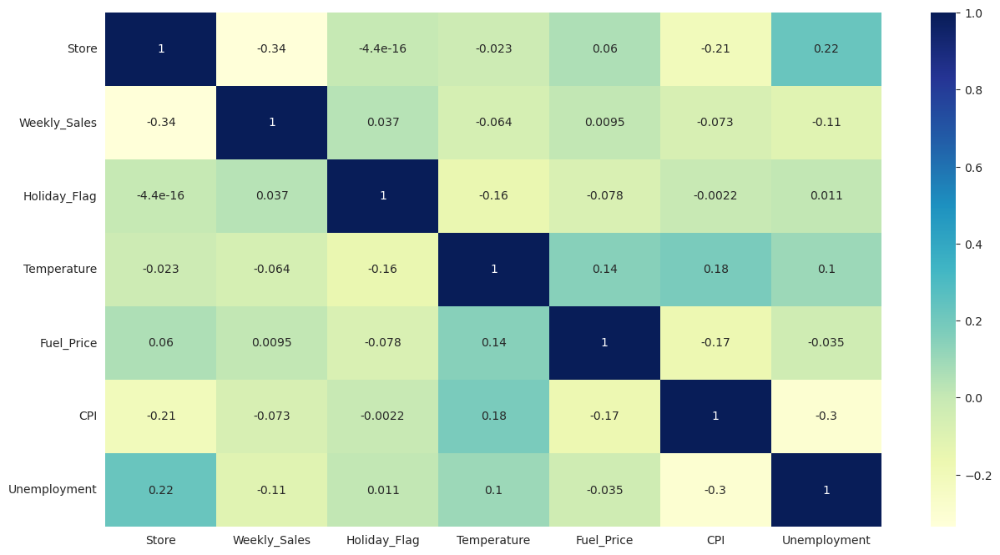

In [38]:
plt.figure(figsize=(15,8))
sns.heatmap(data.select_dtypes(include=['float64', 'int64']).corr(), annot=True, cmap='YlGnBu')
plt.show()

The data does not show multicollinearity.

## 5. Hypothesis<a id='hypotheis'></a>
In this section, we will define our hypothesis and null hypothesis, which form the basis of our analysis. The hypothesis we are investigating is whether there is a correlation between the average temperature and the weekly sales at Walmart stores.

The hypothesis can be stated as follows:

𝐻1: There is a significant correlation between the average temperature and the weekly sales at Walmart stores. As the average temperature increases, we expect to observe higher weekly sales.

𝐻0: Average temperature has no significant correlation with the weekly sales at Walmart stores. There is no consistent relationship between average temperature and weekly sales.

The goal of our analysis is to determine if there is evidence to support the hypothesis that average temperature impacts the weekly sales at Walmart stores. We will use statistical modeling techniques to examine the relationship between the average temperature and weekly sales, taking into account other factors that may influence sales, such as holidays, fuel price, CPI, and unemployment.

By investigating the relationship between average temperature and weekly sales, we aim to gain insights into how external factors, specifically temperature, can affect the sales performance of Walmart stores. This information can help Walmart make informed decisions regarding inventory management, staffing, and marketing strategies to optimize sales and improve overall performance.

In the subsequent sections, we will proceed with data analysis and statistical modeling to test our hypothesis and explore the relationship between average temperature and weekly sales at Walmart stores.


## 6. Statistical Analysis<a id='statistical-analysis'></a>
We will now perform the statistical analysis to test our hypothesis and explore the relationship between average temperature and weekly sales at Walmart stores. We will utilize the statsmodels library in Python to conduct the analysis, specifically using linear regression with mixed effects.

### A. Feature Selection<a id='feature-selection'></a>

In [39]:
data_exp.dtypes

Store                    int64
Date            datetime64[ns]
Weekly_Sales           float64
Holiday_Flag             int64
Temperature            float64
Fuel_Price             float64
CPI                    float64
Unemployment           float64
Temp_degC              float64
Week                    UInt32
Month                    int64
Year                     int64
Store_Rank               int64
dtype: object

In [40]:
data_exp['Week'] = data_exp['Week'].astype('int64')

In [41]:
model_data = data_exp.drop(['Date', 'Temp_degC', 'Store_Rank', 'Year'], axis=1)
model_data.head()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Week,Month
0,1,1643690.90,0,42.31,2.572,211.096358,8.106,5,2
1,1,1641957.44,1,38.51,2.548,211.242170,8.106,6,2
2,1,1611968.17,0,39.93,2.514,211.289143,8.106,7,2
3,1,1409727.59,0,46.63,2.561,211.319643,8.106,8,2
4,1,1554806.68,0,46.50,2.625,211.350143,8.106,9,3


In [42]:
null_llf=None
# Function to calculate AIC and BIC, because mixedlm does not directly give these values
def aibc(result):
    log_likelihood = result.llf
    n_obs = result.nobs
    n_params = result.model.exog.shape[1] - 1
    
    aic= -2 * log_likelihood + 2 * n_params
    bic= -2 * log_likelihood + n_params * np.log(n_obs)
    
    return aic, bic


# Function to claculate results
def mixed_effects (formula, data, re_formula = None):
    model = smf.mixedlm(formula, data=data, 
                    groups=data['Store'], #Grouping variable to account for Random effect and give Random Intercepts
                    re_formula=re_formula, #Give Random slopes based on Temperature for each group
                   )
    result = model.fit()
    aic, bic = aibc(result)
    LR = 2 * (result.llf - null_hypothesis())
    try: 
        pv_temp = round(result.pvalues['Temperature'], 4)
    except:
        pv_temp=None
    return round(LR,2), round(aic, 2), round(bic,2), pv_temp
    

### B. Model Selection<a id='model-selection'></a>

#### Null Hypothesis Model<a id='null-model'></a>

In [43]:
def null_hypothesis():
    global null_llf
    if null_llf is None:
        # Formula including all numerical features
        formula = "Weekly_Sales ~ 1"

        # Fit the Mixed Effects model
        model_null = smf.mixedlm(formula, data=model_data, 
                            groups=data['Store'], #Grouping variable to account for Random effect and give Random Intercepts
                           )
        result_null = model_null.fit()

        # Model Summary
        print(result_null.summary())
        null_llf = result_null.llf
        return null_llf
    else:
        return null_llf
    
print("Log-lilelihood for Null-Hypothesis: ", null_hypothesis())

                  Mixed Linear Model Regression Results
Model:                 MixedLM    Dependent Variable:    Weekly_Sales    
No. Observations:      6435       Method:                REML            
No. Groups:            45         Scale:                 26485282488.7462
Min. group size:       143        Log-Likelihood:        -86503.8428     
Max. group size:       143        Converged:             Yes             
Mean group size:       143.0                                             
-------------------------------------------------------------------------
               Coef.        Std.Err.    z    P>|z|   [0.025      0.975]  
-------------------------------------------------------------------------
Intercept      1046964.878  81451.369 12.854 0.000 887323.128 1206606.628
Group Var 298359437064.425 392115.671                                    

Log-lilelihood for Null-Hypothesis:  -86503.84278146869


In [44]:
# Define dictionary to compare models
formula = "Weekly_Sales ~ 1"
null_LR, aic, bic, pv_temp = mixed_effects(formula, model_data, re_formula = None)
model_compare = {'Null_Hyp': [null_LR, aic, bic, pv_temp]}
model_compare

{'Null_Hyp': [0.0, 173007.69, 173007.69, None]}

#### Pool Regression Model<a id='pool-model'></a>

In [45]:
X = model_data[['Temperature', 'Fuel_Price', 'CPI', 'Unemployment']]
y = model_data['Weekly_Sales']
X = sm.add_constant(X)
model = sm.OLS(y, X)
results_ols = model.fit()
print(results_ols.summary())
ols_LR = 2 * (results_ols.llf - null_hypothesis())
model_compare['pool_reg']=[round(ols_LR,2), round(results_ols.aic,2), round(results_ols.bic,2), round(results_ols.pvalues['Temperature'],4)]

                            OLS Regression Results                            
Dep. Variable:           Weekly_Sales   R-squared:                       0.024
Model:                            OLS   Adj. R-squared:                  0.024
Method:                 Least Squares   F-statistic:                     40.09
Date:                Sat, 27 May 2023   Prob (F-statistic):           3.21e-33
Time:                        10:12:18   Log-Likelihood:                -94273.
No. Observations:                6435   AIC:                         1.886e+05
Df Residuals:                    6430   BIC:                         1.886e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         1.744e+06   7.96e+04     21.918   

#### Mixed Effects Model<a id='mixed-model'></a>

In [46]:
model_compare

{'Null_Hyp': [0.0, 173007.69, 173007.69, None],
 'pool_reg': [-15537.87, 188555.56, 188589.4, 0.0254]}

In [47]:
model_data.columns

Index(['Store', 'Weekly_Sales', 'Holiday_Flag', 'Temperature', 'Fuel_Price',
       'CPI', 'Unemployment', 'Week', 'Month'],
      dtype='object')

In [48]:
me_formula = {1 : "Weekly_Sales ~ Temperature + Fuel_Price + CPI + Unemployment + Holiday_Flag",
              2 : "Weekly_Sales ~ Temperature + Fuel_Price + CPI + Holiday_Flag + Week + Month",
              3 : "Weekly_Sales ~ Temperature + Fuel_Price + Unemployment + Holiday_Flag",
              4 : "Weekly_Sales ~ Temperature + Fuel_Price + CPI + Holiday_Flag",
              5 : "Weekly_Sales ~ Temperature + Fuel_Price + CPI + Unemployment",
              6 : "Weekly_Sales ~ Temperature + CPI + Unemployment + Holiday_Flag",
              7 : "Weekly_Sales ~ Temperature + Holiday_Flag",
              8 : "Weekly_Sales ~ Temperature + Unemployment + Holiday_Flag",
              9 : "Weekly_Sales ~ Temperature + Fuel_Price + Holiday_Flag",
              10: "Weekly_Sales ~ Temperature + CPI + Holiday_Flag" }

for i in range(10):
    LR, aic, bic, pv_temp = mixed_effects(me_formula[i+1], model_data, re_formula = "~Temperature")
    model_compare['Formula {}'.format(i+1)]=[LR, aic, bic, pv_temp]


In [49]:
model_compare

{'Null_Hyp': [0.0, 173007.69, 173007.69, None],
 'pool_reg': [-15537.87, 188555.56, 188589.4, 0.0254],
 'Formula 1': [439.5, 172578.19, 172612.03, 0.0049],
 'Formula 2': [1015.19, 172004.49, 172045.11, 0.0],
 'Formula 3': [421.8, 172593.89, 172620.97, 0.0049],
 'Formula 4': [377.77, 172637.91, 172664.99, 0.0049],
 'Formula 5': [341.94, 172673.74, 172700.82, 0.0006],
 'Formula 6': [390.27, 172625.42, 172652.49, 0.0017],
 'Formula 7': [320.31, 172691.37, 172704.91, 0.0032],
 'Formula 8': [371.85, 172641.83, 172662.14, 0.0014],
 'Formula 9': [340.91, 172672.77, 172693.08, 0.0047],
 'Formula 10': [339.93, 172673.75, 172694.06, 0.0021]}

In [50]:
model_comparison = pd.DataFrame(model_compare, index= ['LR', 'AIC', 'BIC', 'p_val-temperature']).T
model_comparison

,LR,AIC,BIC,p_val-temperature
Null_Hyp,0.00,173007.69,173007.69,NaN
pool_reg,-15537.87,188555.56,188589.40,0.0254
Formula 1,439.50,172578.19,172612.03,0.0049
Formula 2,1015.19,172004.49,172045.11,0.0000
Formula 3,421.80,172593.89,172620.97,0.0049
Formula 4,377.77,172637.91,172664.99,0.0049
Formula 5,341.94,172673.74,172700.82,0.0006
Formula 6,390.27,172625.42,172652.49,0.0017
Formula 7,320.31,172691.37,172704.91,0.0032
Formula 8,371.85,172641.83,172662.14,0.0014


All models above show statistical signifance for Average Temperature in a Week when predicting Weekly Sales for Walmart, except for the Pool Regression model which does not consider the Random Effects of different store regions.
Therefore, we can reject the Null Hypothesis.

We can check the best model among these.

In [51]:
print("Formula with highest LR : {}".format(model_comparison['LR'].idxmax()))
print("Formula with lowest AIC : {}".format(model_comparison['AIC'].idxmin()))
print("Formula with lowest BIC : {}".format(model_comparison['BIC'].idxmin()))
print("Formula with lowest p-value : {}".format(model_comparison['p_val-temperature'].idxmin()))

Formula with highest LR : Formula 2
Formula with lowest AIC : Formula 2
Formula with lowest BIC : Formula 2
Formula with lowest p-value : Formula 2


Formula 2 presents itself to be the best model. We shall now proceed with assessing this model.

## 7. Model Assessment<a id='model-assessment'></a>

### A. Goodness of fit<a id='fit-goodness'></a>

In [52]:
model = smf.mixedlm(me_formula[2], data=model_data, 
                groups=data['Store'], #Grouping variable to account for Random effect and give Random Intercepts
                re_formula="~Temperature", #Give Random slopes based on Temperature for each group
               )
result = model.fit()
print(result.summary())

                         Mixed Linear Model Regression Results
Model:                     MixedLM         Dependent Variable:         Weekly_Sales    
No. Observations:          6435            Method:                     REML            
No. Groups:                45              Scale:                      22712666284.2330
Min. group size:           143             Log-Likelihood:             -85996.2455     
Max. group size:           143             Converged:                  Yes             
Mean group size:           143.0                                                       
---------------------------------------------------------------------------------------
                             Coef.        Std.Err.    z    P>|z|   [0.025      0.975]  
---------------------------------------------------------------------------------------
Intercept                     759483.985 155839.306  4.874 0.000 454044.558 1064923.412
Temperature                    -1903.549    307.528 -6.19

**The p-values for 'Fuel_Price' denotes that the feature is not significant, we can try removing this feature.**

In [53]:
formula = "Weekly_Sales ~ Temperature + CPI + Holiday_Flag + Week + Month"
model = smf.mixedlm(formula, data=model_data, 
                groups=data['Store'], #Grouping variable to account for Random effect and give Random Intercepts
                re_formula="~Temperature", #Give Random slopes based on Temperature for each group
               )
result = model.fit(method='lbfgs') #default method and 'bfgs' does not convergence
print(result.summary())


                         Mixed Linear Model Regression Results
Model:                     MixedLM         Dependent Variable:         Weekly_Sales    
No. Observations:          6435            Method:                     REML            
No. Groups:                45              Scale:                      22711447553.5063
Min. group size:           143             Log-Likelihood:             -86006.0053     
Max. group size:           143             Converged:                  Yes             
Mean group size:           143.0                                                       
---------------------------------------------------------------------------------------
                             Coef.        Std.Err.    z    P>|z|   [0.025      0.975]  
---------------------------------------------------------------------------------------
Intercept                     790123.499 134021.815  5.895 0.000 527445.569 1052801.429
Temperature                    -1912.926    306.686 -6.23

In [54]:
LR = 2 * (result.llf - null_hypothesis())
aic, bic = aibc(result)
pv_temp = result.pvalues['Temperature']
model_compare['Formula 11']=[round(LR,2), round(aic,2), round(bic,2), round(pv_temp,4)]
model_comparison = pd.DataFrame(model_compare, index= ['LR', 'AIC', 'BIC', 'p_val-temperature']).T
model_comparison

,LR,AIC,BIC,p_val-temperature
Null_Hyp,0.00,173007.69,173007.69,NaN
pool_reg,-15537.87,188555.56,188589.40,0.0254
Formula 1,439.50,172578.19,172612.03,0.0049
Formula 2,1015.19,172004.49,172045.11,0.0000
Formula 3,421.80,172593.89,172620.97,0.0049
Formula 4,377.77,172637.91,172664.99,0.0049
Formula 5,341.94,172673.74,172700.82,0.0006
Formula 6,390.27,172625.42,172652.49,0.0017
Formula 7,320.31,172691.37,172704.91,0.0032
Formula 8,371.85,172641.83,172662.14,0.0014


In [55]:
print("Formula with highest LR : {}".format(model_comparison['LR'].idxmax()))
print("Formula with lowest AIC : {}".format(model_comparison['AIC'].idxmin()))
print("Formula with lowest BIC : {}".format(model_comparison['BIC'].idxmin()))
print("Formula with lowest p-value : {}".format(model_comparison['p_val-temperature'].idxmin()))

Formula with highest LR : Formula 2
Formula with lowest AIC : Formula 2
Formula with lowest BIC : Formula 2
Formula with lowest p-value : Formula 2


The model does not converge when we remove the Fuel Price feature and use the default method, but, it converges when we use the 'LBFGS' method. This results in an increase in AIC and BIC. So, we shall retain the 'Fuel_Price' feature.

**We can also consider a model where the random slopes are not based on temperature.**

In [56]:
formula = "Weekly_Sales ~ Temperature + Fuel_Price + CPI + Holiday_Flag + Week + Month"
model = smf.mixedlm(formula, data=model_data, 
                groups=data['Store'], #Grouping variable to account for Random effect and give Random Intercepts
                re_formula="~1", #Give Random slopes based on Temperature for each group
               )
result = model.fit()
print(result.summary())

                    Mixed Linear Model Regression Results
Model:                 MixedLM      Dependent Variable:      Weekly_Sales    
No. Observations:      6435         Method:                  REML            
No. Groups:            45           Scale:                   23516274794.9007
Min. group size:       143          Log-Likelihood:          -86073.6863     
Max. group size:       143          Converged:               Yes             
Mean group size:       143.0                                                 
-----------------------------------------------------------------------------
                  Coef.        Std.Err.     z    P>|z|   [0.025      0.975]  
-----------------------------------------------------------------------------
Intercept          701677.851 153020.235   4.586 0.000 401763.702 1001591.999
Temperature         -1852.732    133.248 -13.904 0.000  -2113.894   -1591.571
Fuel_Price          -4082.147   6605.931  -0.618 0.537 -17029.533    8865.240
CPI   

In [57]:
LR = 2 * (result.llf - null_hypothesis())
aic, bic = aibc(result)
pv_temp = result.pvalues['Temperature']
model_compare['Formula 12']=[round(LR,2), round(aic,2), round(bic,2), round(pv_temp,4)]
model_comparison = pd.DataFrame(model_compare, index= ['LR', 'AIC', 'BIC', 'p_val-temperature']).T
model_comparison

,LR,AIC,BIC,p_val-temperature
Null_Hyp,0.00,173007.69,173007.69,NaN
pool_reg,-15537.87,188555.56,188589.40,0.0254
Formula 1,439.50,172578.19,172612.03,0.0049
Formula 2,1015.19,172004.49,172045.11,0.0000
Formula 3,421.80,172593.89,172620.97,0.0049
Formula 4,377.77,172637.91,172664.99,0.0049
Formula 5,341.94,172673.74,172700.82,0.0006
Formula 6,390.27,172625.42,172652.49,0.0017
Formula 7,320.31,172691.37,172704.91,0.0032
Formula 8,371.85,172641.83,172662.14,0.0014


In [58]:
print("Formula with highest LR : {}".format(model_comparison['LR'].idxmax()))
print("Formula with lowest AIC : {}".format(model_comparison['AIC'].idxmin()))
print("Formula with lowest BIC : {}".format(model_comparison['BIC'].idxmin()))
print("Formula with lowest p-value : {}".format(model_comparison['p_val-temperature'].idxmin()))

Formula with highest LR : Formula 2
Formula with lowest AIC : Formula 2
Formula with lowest BIC : Formula 2
Formula with lowest p-value : Formula 2


### B. Model Diagnostics<a id='model-diagnostics'></a>
We can perform model diagnostics to assess the assumptions and identify potential issues with your selected model.

In [59]:
formula = "Weekly_Sales ~ Temperature + Fuel_Price + CPI + Holiday_Flag + Week + Month"
model = smf.mixedlm(formula, data=model_data, 
                groups=data['Store'], #Grouping variable to account for Random effect and give Random Intercepts
                re_formula="~Temperature", #Give Random slopes based on Temperature for each group
               )
result = model.fit()

#### Residual Analysis for all Stores<a id='residual-analaysis-all-stores'></a>

We can examine the residuals (i.e., the differences between observed and predicted values) to check for patterns, such as non-linearity, heteroscedasticity, and outliers. 

In [60]:
residuals = result.resid
residuals.head()

0     73339.884215
1     28908.093738
2     51341.195172
3   -121578.559730
4    -21272.406651
dtype: float64

#### Scatterplot of Residuals vs. Predicted Values:
If the assumption of linearity is met, we expect to see a random scatter of points around the horizontal line at zero. This suggests that the relationship between the predicted values and the residuals is not systematically biased.

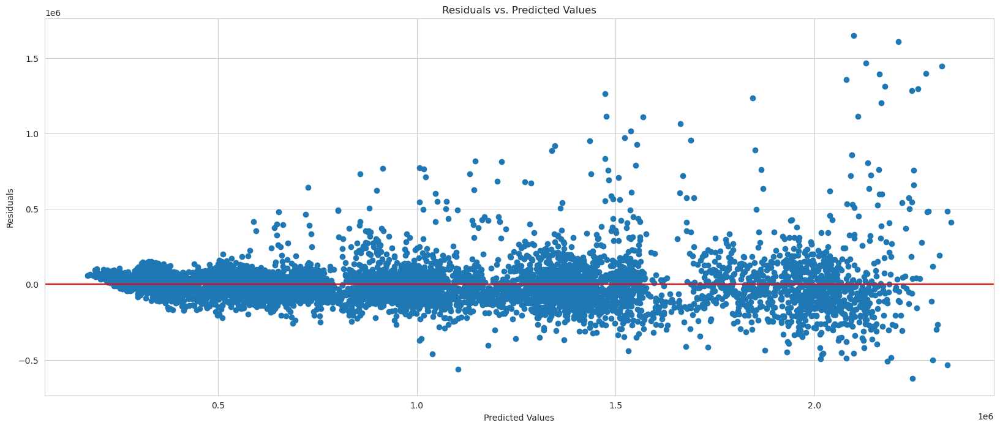

In [61]:
plt.figure(figsize=(20, 8))

predicted_values = result.fittedvalues
plt.scatter(predicted_values, residuals)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs. Predicted Values')
plt.show()

#### Scatterplot of Residuals vs. Independent Variables:
For each independent variable, if the assumption of linearity is met, we expect to see a random scatter of points around the horizontal line at zero. This indicates that there is no systematic relationship between the residuals and the independent variables.

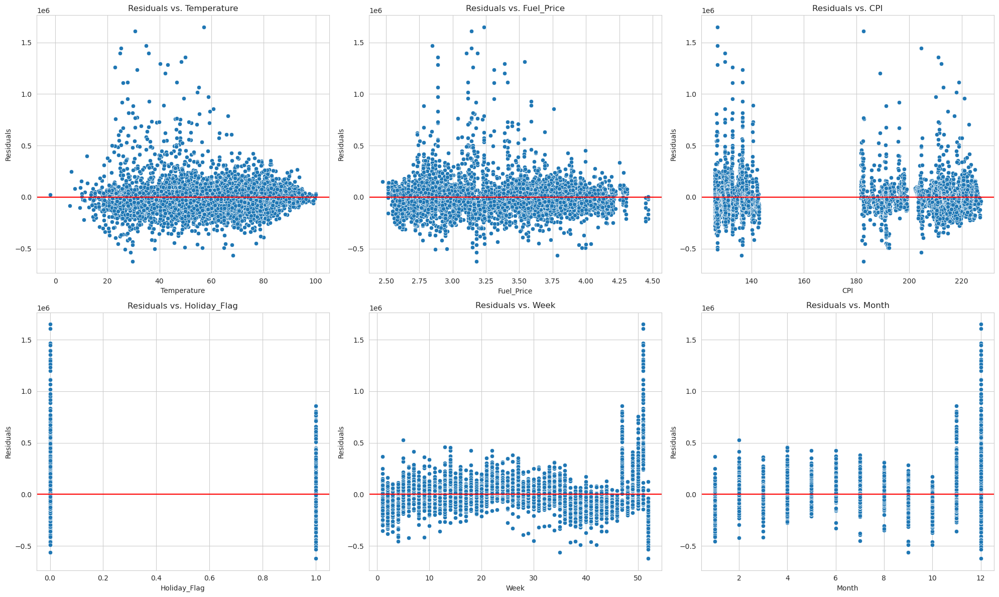

In [62]:
independent_vars = ['Temperature', 'Fuel_Price', 'CPI', 'Holiday_Flag', 'Week', 'Month']
fig, axes = plt.subplots(2, 3, figsize=(20, 12))  # Create a 3x2 grid of subplots

# Flatten the axes array to simplify indexing
axes = axes.flatten()

# Plot each scatterplot
for i, var in enumerate(independent_vars):
    sns.scatterplot(data=model_data, x=var, y=residuals, ax=axes[i])
    axes[i].axhline(y=0, color='r', linestyle='-')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('Residuals')
    axes[i].set_title(f'Residuals vs. {var}')

# Remove empty subplots if there are less than 6 variables
if len(independent_vars) < 6:
    for i in range(len(independent_vars), 6):
        fig.delaxes(axes[i])

# Adjust spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()

#### Histogram or Density Plot of Residuals:
If the assumption of normality is met, we expect to see a bell-shaped distribution of the residuals in the histogram or a smooth, symmetric curve in the density plot. Deviations from normality may indicate departures from the assumption.

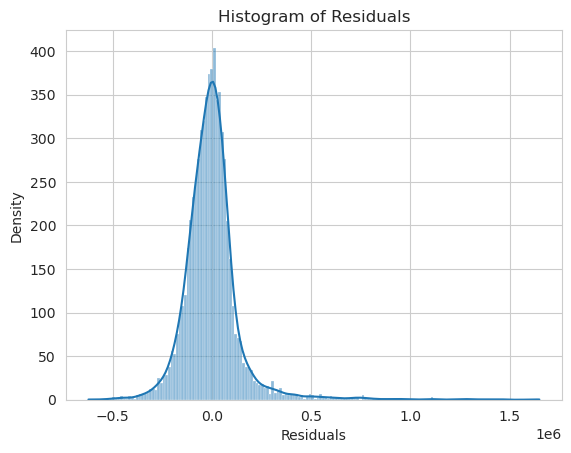

In [63]:
sns.histplot(residuals, kde=True)
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.title('Histogram of Residuals')
plt.show()

#### QQ Plot:
If the assumption of normality is met, we expect the points in the QQ plot to fall approximately along a straight line. The points should closely follow the diagonal line, indicating that the residuals are normally distributed. Departures from linearity suggest deviations from normality.

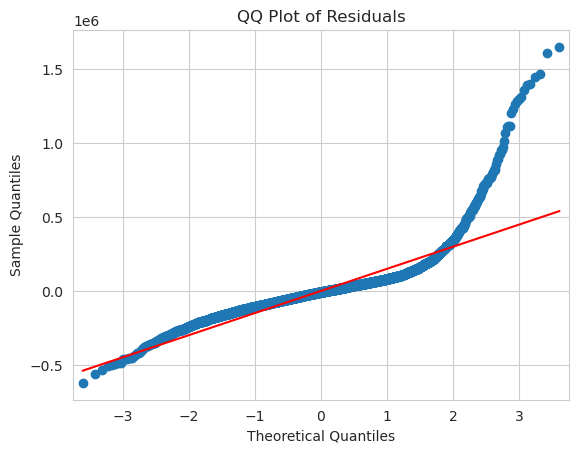

In [64]:
sm.qqplot(residuals, line='s')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.title('QQ Plot of Residuals')
plt.show()

#### Autocorrelation Plot
The plot checks if the data comes within the 95% correalation interval.

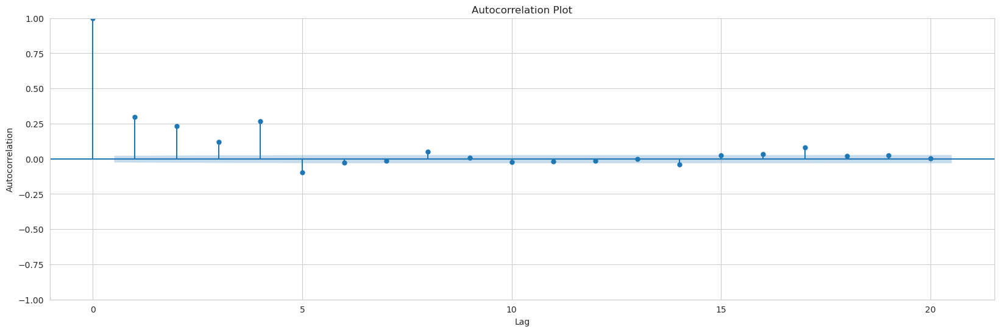

In [65]:
from statsmodels.graphics.tsaplots import plot_acf
# Plot autocorrelation
fig, ax = plt.subplots(figsize=(20,6))
plot_acf(residuals, lags=20, ax=ax)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.title('Autocorrelation Plot')
plt.show()

We can see that there is no autocorrelation present.

#### Residual Analysis for each Store<a id='residual-analysis-each-store'></a>

We can once again take a look at the Store wise Weekly Sales data that we saw earlier.

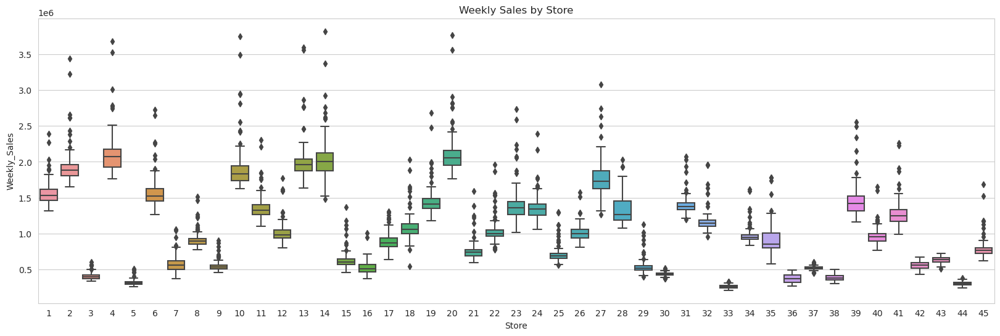

In [66]:
# Weekly sales per store
plt.figure(figsize=(20, 6))
plt.title('Weekly Sales by Store')
sns.boxplot(data=data, x='Store', y='Weekly_Sales')
plt.show()

#### Scatterplot of Residuals vs. Predicted Values:

In [67]:
model_resid = pd.concat([model_data['Store'], result.resid, result.fittedvalues], axis=1)
model_resid.columns=['Store', 'Residuals', 'Fittedvalues']
model_resid

,Store,Residuals,Fittedvalues
0,1,73339.884215,1.570351e+06
1,1,28908.093738,1.613049e+06
2,1,51341.195172,1.560627e+06
3,1,-121578.559730,1.531306e+06
4,1,-21272.406651,1.576079e+06
...,...,...,...
6430,45,-83452.875218,7.966268e+05
6431,45,-107932.909241,8.413880e+05
6432,45,-121818.837762,8.562832e+05
6433,45,-125004.368340,8.431299e+05


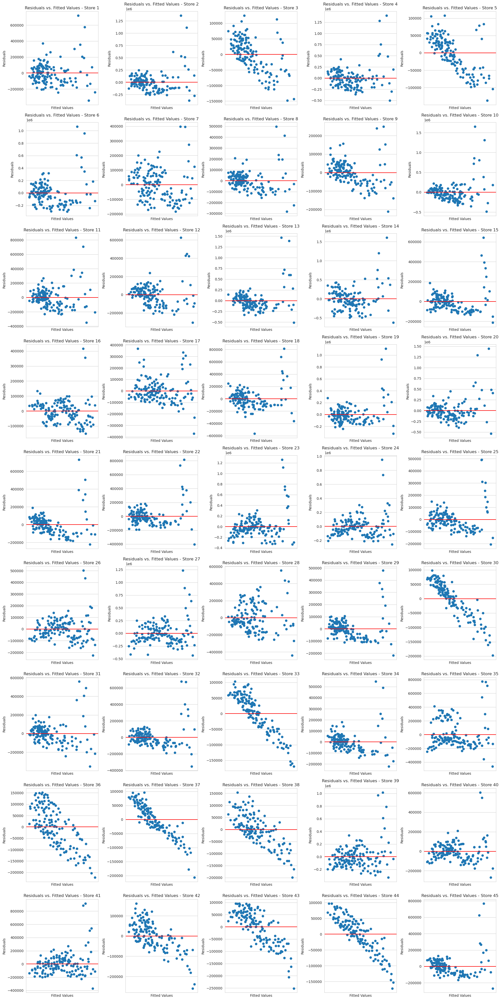

In [68]:
# Get unique store values
stores = model_resid['Store'].unique()

# Set the number of plots per row
num_plots_per_row = 5

# Calculate the number of rows needed
num_rows = int(np.ceil(len(stores) / num_plots_per_row))

# Create subplots
fig, axes = plt.subplots(num_rows, num_plots_per_row, figsize=(20, 40))

# Flatten the axes array to simplify indexing
axes = axes.flatten()

# Iterate over each store and create a plot
for i, store in enumerate(stores):
    # Filter data for the current store
    store_data = model_resid[model_resid['Store'] == store]
    
    # Get the fitted values and residuals for the current store
    fitted_values = store_data['Fittedvalues']
    residuals = store_data['Residuals']
    
    # Calculate the row and column indices for the subplot
    row = i // num_plots_per_row
    col = i % num_plots_per_row
    
    # Plot residuals vs. fitted values
    axes[i].scatter(fitted_values, residuals)
    axes[i].axhline(y=0, color='r', linestyle='-')
    axes[i].set_xlabel('Fitted Values')
    axes[i].set_ylabel('Residuals')
    axes[i].set_title(f'Residuals vs. Fitted Values - Store {store}')
    axes[i].set_xticks([]) #Remove tick on X axis
    
    
# Adjust spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()

We can see a clear pattern comparing the above two plots. It shows that for stores with low sales range there is a violation of Homoscedasticity.The presence of outliers can also be seen.

#### Histogram or Density Plot of Residuals:

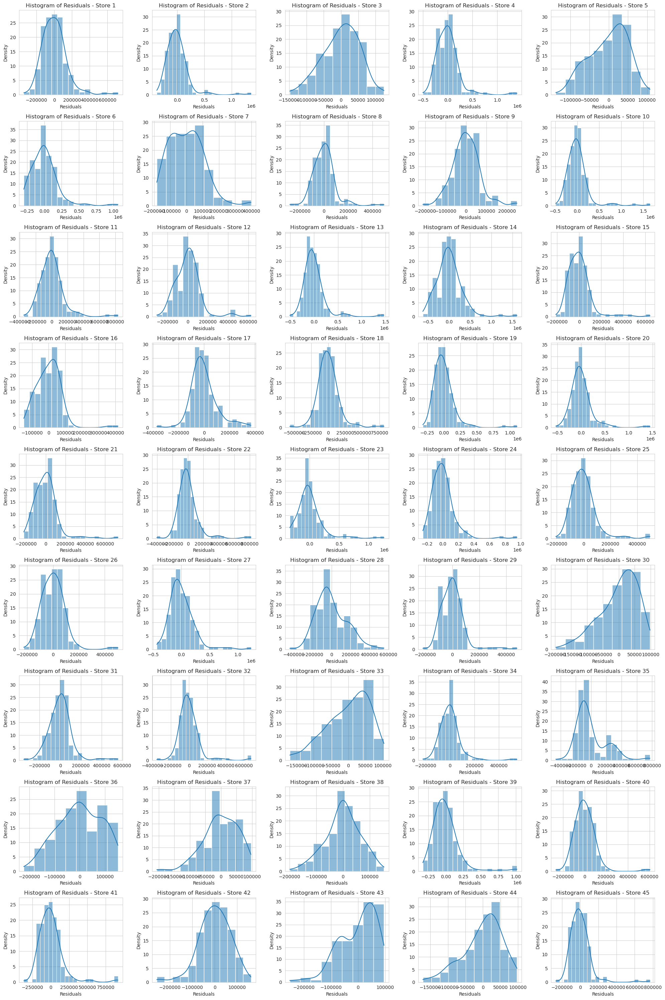

In [69]:
stores = model_resid['Store'].unique()
num_stores = len(stores)
num_plots_per_row = 5
num_rows = (num_stores // num_plots_per_row)

fig, axes = plt.subplots(num_rows, num_plots_per_row, figsize=(20, 30))

for i, store in enumerate(stores):
    row = i // num_plots_per_row
    col = i % num_plots_per_row
    
    store_residuals = model_resid[model_resid['Store'] == store]['Residuals']
    
    ax = axes[row, col] if num_rows > 1 else axes[col]
    
    sns.histplot(store_residuals, kde=True, ax=ax)
    ax.set_xlabel('Residuals')
    ax.set_ylabel('Density')
    ax.set_title(f'Histogram of Residuals - Store {store}')

# Adjust spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()

#### QQ Plot:

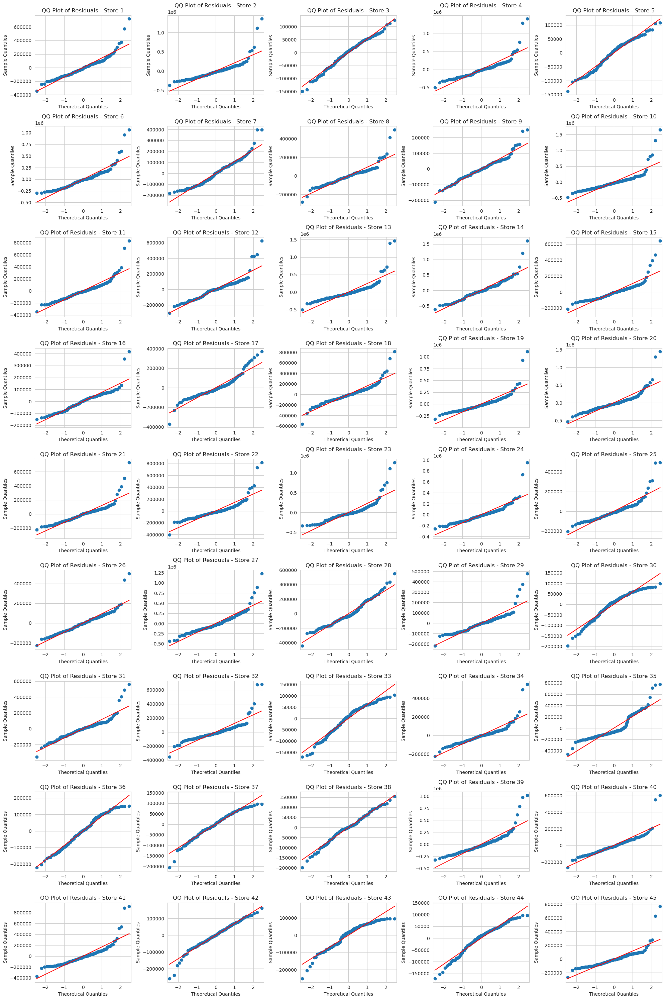

In [70]:
stores = model_resid['Store'].unique()
num_stores = len(stores)
num_plots_per_row = 5
num_rows = (num_stores // num_plots_per_row)

fig, axes = plt.subplots(num_rows, num_plots_per_row, figsize=(20, 30))

for i, store in enumerate(stores):
    row = i // num_plots_per_row
    col = i % num_plots_per_row
    
    store_residuals = model_resid[model_resid['Store'] == store]['Residuals']
    
    ax = axes[row, col] if num_rows > 1 else axes[col]
    
    sm.qqplot(store_residuals, line='s', ax=ax)
    ax.set_xlabel('Theoretical Quantiles')
    ax.set_ylabel('Sample Quantiles')
    ax.set_title(f'QQ Plot of Residuals - Store {store}')
    
# Adjust spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()

When observing the QQ-plots and comparing it with the Weekly Sales plot we see that stores with medium range sales show higher normality than stores with high sales and those with very low sales. Examples are Store 16, Store 36, etc. The presence of outliers is seen in these plots as well.

### C. Model Assumptions - Interpretation of  the plots<a id='model-assumptions'></a>

Using Linear Regression model considers the folowin assumptions:

1. **Linearity -** 
From the Residuals vs Fitted values plots it can be seen that, while most of the stores show linearity along with the presence of outliers, there are those that do not. Primarily the stores with less sales overall. The Residuals VS Independent Variables plot shows that the assumption of Linearity is met for the independent variables.

2. **Independence -**
The autocorrelation plot shows that there is no autocorrelation present and therefore the Assumption of Independence is satisfied.

3. **Homoscedasticity -**
The Residuals vs Fitted Values plot shows that Homoscedasticity is violated for some of the Stores, as for these Stores Residuals change systemically with change in fitted values.

4. **Normality -**
The Histogram plot of residuals and QQ plot shows that, except for a few Stores, Normality is absent. Therefore this assumption is not satisfied.

5. **No Multicollinearty -**
We have seen from the COrrelation matrix created during EDA that correlation amongst variables does not exist. So, this assumption is satisfied.


## 8. Interpretation of Results<a id='interpreting-results'></a>

In [71]:
formula = "Weekly_Sales ~ Temperature + Fuel_Price + CPI + Holiday_Flag + Week + Month"
model = smf.mixedlm(formula, data=model_data, 
                groups=data['Store'], #Grouping variable to account for Random effect and give Random Intercepts
                re_formula="~Temperature", #Give Random slopes based on Temperature for each group
               )
result = model.fit()

In [72]:
print(result.summary())

                         Mixed Linear Model Regression Results
Model:                     MixedLM         Dependent Variable:         Weekly_Sales    
No. Observations:          6435            Method:                     REML            
No. Groups:                45              Scale:                      22712666284.2330
Min. group size:           143             Log-Likelihood:             -85996.2455     
Max. group size:           143             Converged:                  Yes             
Mean group size:           143.0                                                       
---------------------------------------------------------------------------------------
                             Coef.        Std.Err.    z    P>|z|   [0.025      0.975]  
---------------------------------------------------------------------------------------
Intercept                     759483.985 155839.306  4.874 0.000 454044.558 1064923.412
Temperature                    -1903.549    307.528 -6.19

### A. Coefficients Interpretation<a id='coefficients-interpretation'></a>

In [73]:
result.params

Intercept                  759483.985095
Temperature                 -1903.549309
Fuel_Price                  -2498.005962
CPI                          1731.798834
Holiday_Flag                39496.871171
Week                        -8744.520819
Month                       53226.521702
Group Var                      17.523785
Group x Temperature Cov        -0.035436
Temperature Var                 0.000152
dtype: float64

#### Fixed Effects
1. **Intercept:**

The intercept term represents the estimated weekly sales when all other predictor variables are zero or have no effect.
In this model, the estimated intercept is 759,483.99. This suggests that, on average, the expected weekly sales are around 759,483.99 units when all other variables are held constant.

2. **Temperature:**

The coefficient for temperature is -1903.55. This indicates that, on average, a one-unit increase in temperature is associated with a decrease of 1903.55 units in weekly sales.
The negative sign suggests an inverse relationship between temperature and weekly sales. As temperature increases, the model predicts a decrease in sales.

3. **Fuel_Price:**

The coefficient for fuel price is -2498.01. This suggests that, on average, a one-unit increase in fuel price is associated with a decrease of 2498.01 units in weekly sales.
Similarly to temperature, the negative sign implies an inverse relationship between fuel price and weekly sales. Higher fuel prices are associated with lower sales.

4. **CPI:**

The coefficient for CPI is 1731.80. This means that, on average, a one-unit increase in the Consumer Price Index (CPI) is associated with an increase of 1731.80 units in weekly sales.
The positive sign indicates a positive relationship between CPI and sales. Higher CPI values are associated with higher sales.

5. **Holiday_Flag:**

The coefficient for the Holiday_Flag is 39496.87. This suggests that, on average, holidays are associated with an increase of 39496.87 units in weekly sales.
The positive sign indicates that holidays have a positive impact on sales, as expected.

6. **Week:**

The coefficient for Week is -8744.52. This means that, on average, a one-unit increase in the week number is associated with a decrease of 8744.52 units in weekly sales.
The negative sign suggests a decreasing trend in sales as the weeks progress.

7. **Month:**

The coefficient for Month is 53226.52. This indicates that, on average, a one-unit increase in the month number is associated with an increase of 53226.52 units in weekly sales.
The positive sign suggests a positive relationship between the month and sales. Sales tend to increase as the months progress.

#### Random Effects

8. **Group Var:**

The estimated variance for the random effects at the group level is 17.52. This represents the amount of variation in sales that can be attributed to differences between store groups that are not explained by the fixed effects variables.

9. **Group x Temperature Cov:**

The estimated covariance between the group random effect and the temperature variable is -0.035. This suggests a slight negative relationship between the group-specific intercepts and the temperature effect.

10. **Temperature Var:**

The estimated variance for the random effects at the temperature level is 0.000152. This represents the amount of variation in sales within each store group that can be attributed to differences in temperature.

### B. P-Values<a id='pvalues-interpretation'></a>

In [74]:
result.pvalues

Intercept                  1.096343e-06
Temperature                6.022796e-10
Fuel_Price                 6.989717e-01
CPI                        3.203205e-02
Holiday_Flag               2.403484e-07
Week                       6.068334e-09
Month                      4.644370e-16
Group Var                  3.764547e-06
Group x Temperature Cov    5.609906e-04
Temperature Var            9.991846e-05
dtype: float64

#### Fixed Effects

1. **Intercept:**

The p-value for the intercept is 1.096343e-06, which is very small.
This indicates that the intercept term is statistically significant, suggesting that the estimated weekly sales when all other predictor variables are zero is significantly different from zero.

2. **Temperature:**

The p-value for the temperature variable is 6.022796e-10, which is very small.
This suggests that the temperature variable is statistically significant and has a significant impact on weekly sales. A one-unit change in temperature is associated with a significant change in sales.

3. **Fuel_Price:**

The p-value for the fuel price variable is 6.989717e-01, which is relatively large.
This suggests that the fuel price variable is not statistically significant in predicting weekly sales. The coefficient estimate for fuel price may not have a significant impact on sales.

4. **CPI:**

The p-value for the CPI variable is 3.203205e-02.
This indicates that the CPI variable is statistically significant, suggesting that changes in the Consumer Price Index have a significant impact on weekly sales..

5. **Holiday_Flag:**

The p-value for the Holiday_Flag variable is 2.403484e-07, which is very small.
This indicates that the Holiday_Flag variable is statistically significant and has a significant impact on weekly sales. Holidays have a significant influence on sales.

6. **Week:**

The p-value for the Week variable is 6.068334e-09, which is very small.
This suggests that the Week variable is statistically significant and has a significant impact on weekly sales. The week number has a significant influence on sales.

7. **Month:**

The p-value for the Month variable is 4.644370e-16, which is very small.
This indicates that the Month variable is statistically significant and has a significant impact on weekly sales. The month number has a significant influence on sales.

#### Random Effects

8. **Group Var:**

The p-value for the Group Var (variance of random effects at the group level) is 3.764547e-06, which is very small.
This suggests that there is significant variation in sales across different store groups that is not explained by the fixed effects variables.

9. **Group x Temperature Cov:**

The p-value for the Group x Temperature Cov (covariance between group random effect and temperature) is 5.609906e-04, which is small.
This suggests that there is a significant relationship between the group-specific intercepts and the temperature effect.

10. **Temperature Var:**

The p-value for the Temperature Var (variance of random effects at the temperature level) is 9.991846e-05, which is very small.
This indicates that there is significant variation in sales within each store group that is attributable to differences in temperature.


## 9. Performance Metrics Evaluation<a id='perfomrance-metrics'></a>

### A. R-Squared value<a id='rsquare'></a>

In [75]:
def r2(result, data):
    # Get the fitted and actual values
    fitted_values = result.fittedvalues
    actual_values = data['Weekly_Sales']

    # Calculate the total sum of squares (TSS)
    tss = ((actual_values - np.mean(actual_values))**2).sum()

    # Calculate the residual sum of squares (RSS)
    rss = ((actual_values - fitted_values)**2).sum()

    # Calculate the R-squared
    r_squared = 1 - (rss / tss)
    return r_squared

r_squared = r2(result, model_data)
print(f"R-squared: {r_squared:.4f}")

R-squared: 0.9296


### B. Adjusted R-Squared value<a id='adjusted-rsquare'></a>

In [76]:
def adj_r2(result, data):
    r_squared = r2(result, data)
    n= result.nobs #Number of observations
    k= len(result.params)-4 # Number of predictors excluding intercept

    adjusted_r_squared = 1 - ((1 - r_squared) * (n - 1) / (n - k - 1))
    return adjusted_r_squared

adjusted_r_squared = adj_r2(result, model_data)
print(f"Adjusted R-squared: {adjusted_r_squared:.4f}")

Adjusted R-squared: 0.9296


### C. Mean Squared Error (MSE) and Root Mean Squared Error (MSE)<a id='rmse'></a>

In [77]:
residuals = result.resid
mse = (residuals**2).mean()
print(f'Mean Squared Error (MSE): {mse:.4f}')
rmse = np.sqrt(mse)
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')

Mean Squared Error (MSE): 22412604585.9572
Root Mean Squared Error (RMSE): 149708.3985


## 10. Sensitivity Analysis<a id='sensitivity-analysis'></a>

We define two alternative models, 
* alternative_model_1 - Where we remove a feature and check how it affects the coefficients
* alternative_model_2 - We can add an additional feature and check its effects

In [78]:
# We use the datframe with more features for this analysis
model_data2 = data_exp.copy()
model_data2.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Temp_degC,Week,Month,Year,Store_Rank
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,5.727778,5,2,2010,9
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,3.616667,6,2,2010,9
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,4.405556,7,2,2010,9
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,8.127778,8,2,2010,9
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,8.055556,9,3,2010,9


In [79]:
# Initial Model
formula = "Weekly_Sales ~ Temperature + Fuel_Price + CPI + Holiday_Flag + Week + Month"
initial_model = smf.mixedlm(formula, data=model_data2, 
                groups=data['Store'], #Grouping variable to account for Random effect and give Random Intercepts
                re_formula="~Temperature", #Give Random slopes based on Temperature for each group
               )
initial_results = initial_model.fit()
print(initial_results.summary())

# Alternative Model 1 (Remove Month and Random Slopes by Temperature)
formula = "Weekly_Sales ~ Temperature + Fuel_Price + CPI + Holiday_Flag + Week"
alternative_model_1 = smf.mixedlm(formula, data=model_data2, 
                groups=data['Store'], #Grouping variable to account for Random effect and give Random Intercepts
               )
alternative_results_1 = alternative_model_1.fit()
print(alternative_results_1.summary())

# Alternative Model 2 (Include Year and Store Rank)

formula = "Weekly_Sales ~ Temperature + Fuel_Price + CPI + Holiday_Flag + Week + Month + Store_Rank + Year"
alternative_model_2 = smf.mixedlm(formula, data=model_data2, 
                                groups=data['Store'], #Grouping variable to account for Random effect and give Random Intercepts
                                re_formula="~Temperature", #Give Random slopes based on Temperature for each group
                                )
alternative_results_2 = alternative_model_2.fit()
print(alternative_results_2.summary())

                         Mixed Linear Model Regression Results
Model:                     MixedLM         Dependent Variable:         Weekly_Sales    
No. Observations:          6435            Method:                     REML            
No. Groups:                45              Scale:                      22712666284.2330
Min. group size:           143             Log-Likelihood:             -85996.2455     
Max. group size:           143             Converged:                  Yes             
Mean group size:           143.0                                                       
---------------------------------------------------------------------------------------
                             Coef.        Std.Err.    z    P>|z|   [0.025      0.975]  
---------------------------------------------------------------------------------------
Intercept                     759483.985 155839.306  4.874 0.000 454044.558 1064923.412
Temperature                    -1903.549    307.528 -6.19

In [80]:
params_df = pd.DataFrame(index=alternative_results_2.params.keys(), columns=['Initial Model', 'Alternative Model 1', 'Alternative Model 2']) 
# We use alternative_results_2 becuase it has the most features

params_df['Initial Model'] = round(initial_results.params,2)
params_df['Alternative Model 1'] = round(alternative_results_1.params,2)
params_df['Alternative Model 2'] = round(alternative_results_2.params,2)
params_df

,Initial Model,Alternative Model 1,Alternative Model 2
Intercept,759483.99,817124.29,-4146921.98
Temperature,-1903.55,-1831.59,-1912.54
Fuel_Price,-2498.01,-5845.58,2110.17
CPI,1731.80,1573.24,160.96
Holiday_Flag,39496.87,36644.41,39630.59
Week,-8744.52,3411.84,-8557.20
Month,53226.52,NaN,52666.89
Store_Rank,NaN,NaN,-39074.06
Year,NaN,NaN,3013.13
Group Var,17.52,12.91,1.68


In [81]:
pvalue_df = pd.DataFrame(index=alternative_results_2.pvalues.keys(), columns=['Initial Model', 'Alternative Model 1', 'Alternative Model 2']) 
# We use alternative_results_2 becuase it has the most features

pvalue_df['Initial Model'] = round(initial_results.pvalues,2)
pvalue_df['Alternative Model 1'] = round(alternative_results_1.pvalues,2)
pvalue_df['Alternative Model 2'] = round(alternative_results_2.pvalues,2)
pvalue_df

,Initial Model,Alternative Model 1,Alternative Model 2
Intercept,0.00,0.00,0.65
Temperature,0.00,0.00,0.00
Fuel_Price,0.70,0.38,0.79
CPI,0.03,0.06,0.63
Holiday_Flag,0.00,0.00,0.00
Week,0.00,0.00,0.00
Month,0.00,NaN,0.00
Store_Rank,NaN,NaN,0.00
Year,NaN,NaN,0.51
Group Var,0.00,0.00,0.00


From the above sensitivity analysis we can see that effect of most of the features are in the same direction (+/-). 

The Fuel_Price remainins statistically insignificant in the models. In 'alternative_model_2' CPI becoes statistically insignificant as well.

In [82]:
result.params.keys()

Index(['Intercept', 'Temperature', 'Fuel_Price', 'CPI', 'Holiday_Flag', 'Week',
       'Month', 'Group Var', 'Group x Temperature Cov', 'Temperature Var'],
      dtype='object')

## 11. Impact of Outliers<a id='outliers-impact'></a>

We have seen that the model is affected by outliers. We can try to remove these and evaluate the performance of the model. We can apply an outlier detection method, such as the interquartile range (IQR) method, to identify outliers in the Weekly_Sales variable, using a sing a cutoff value of 1.5 times the IQR threshold.

In [83]:
outliers = {}  # Dictionary to store outliers for each store

# Group the data by 'Store'
grouped_data = model_data.groupby('Store')

# Iterate over each store subset
for store, data_group in grouped_data:
    # Apply outlier detection method (using IQR)
    q1 = data_group['Weekly_Sales'].quantile(0.25)
    q3 = data_group['Weekly_Sales'].quantile(0.75)
    iqr = q3 - q1
    lower_threshold = q1 - 1.5 * iqr
    upper_threshold = q3 + 1.5 * iqr

    # Identify outliers for the current store
    store_outliers = data_group[(data_group['Weekly_Sales'] < lower_threshold) | (data_group['Weekly_Sales'] > upper_threshold)]

    # Store the outliers in the dictionary
    outliers[store] = store_outliers.index.tolist()

# Create a new dataset excluding the identified outliers
model_data_excluding_outliers = model_data.drop(sum(outliers.values(), [])).reset_index()

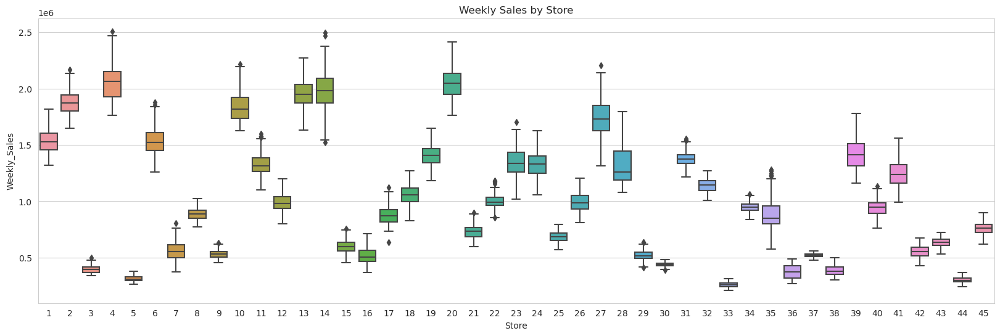

In [84]:
# Weekly sales per store
plt.figure(figsize=(20, 6))
plt.title('Weekly Sales by Store')
sns.boxplot(data=model_data_excluding_outliers, x='Store', y='Weekly_Sales')
plt.show()

In [85]:
formula = "Weekly_Sales ~ Temperature + Fuel_Price + CPI + Holiday_Flag + Week + Month"
model = smf.mixedlm(formula, data=model_data_excluding_outliers, 
                groups=model_data_excluding_outliers['Store'], #Grouping variable to account for Random effect and give Random Intercepts
                re_formula="~1", #Give Random slopes based for each group, as slopes based on Temperature causes convergebce issues
               )
result_excluding_sales_outliers = model.fit()
print(result_excluding_sales_outliers.summary())


                   Mixed Linear Model Regression Results
Model:                 MixedLM      Dependent Variable:      Weekly_Sales   
No. Observations:      6135         Method:                  REML           
No. Groups:            45           Scale:                   8166633915.8557
Min. group size:       129          Log-Likelihood:          -78847.8868    
Max. group size:       143          Converged:               Yes            
Mean group size:       136.3                                                
----------------------------------------------------------------------------
                  Coef.        Std.Err.     z    P>|z|   [0.025     0.975]  
----------------------------------------------------------------------------
Intercept          293791.569 117647.557   2.497 0.013  63206.594 524376.545
Temperature           696.765     84.835   8.213 0.000    530.491    863.040
Fuel_Price         -11730.560   4049.949  -2.896 0.004 -19668.315  -3792.805
CPI                

In [86]:
LR = 2 * (result_excluding_sales_outliers.llf - null_hypothesis())
aic, bic = aibc(result_excluding_sales_outliers)
pv_temp = result_excluding_sales_outliers.pvalues['Temperature']
model_compare['Model_wo_Sales_outliers']=[round(LR,2), round(aic,2), round(bic,2), round(pv_temp,4)]
model_comparison = pd.DataFrame(model_compare, index= ['LR', 'AIC', 'BIC', 'p_val-temperature']).T
model_comparison

,LR,AIC,BIC,p_val-temperature
Null_Hyp,0.00,173007.69,173007.69,NaN
pool_reg,-15537.87,188555.56,188589.40,0.0254
Formula 1,439.50,172578.19,172612.03,0.0049
Formula 2,1015.19,172004.49,172045.11,0.0000
Formula 3,421.80,172593.89,172620.97,0.0049
Formula 4,377.77,172637.91,172664.99,0.0049
Formula 5,341.94,172673.74,172700.82,0.0006
Formula 6,390.27,172625.42,172652.49,0.0017
Formula 7,320.31,172691.37,172704.91,0.0032
Formula 8,371.85,172641.83,172662.14,0.0014


In [87]:
print("Formula with highest LR : {}".format(model_comparison['LR'].idxmax()))
print("Formula with lowest AIC : {}".format(model_comparison['AIC'].idxmin()))
print("Formula with lowest BIC : {}".format(model_comparison['BIC'].idxmin()))
print("Formula with lowest p-value : {}".format(model_comparison['p_val-temperature'].idxmin()))

Formula with highest LR : Model_wo_Sales_outliers
Formula with lowest AIC : Model_wo_Sales_outliers
Formula with lowest BIC : Model_wo_Sales_outliers
Formula with lowest p-value : Formula 2


We can see that removing the outliers in weekly sales increases the LR value and reduces the AIC and BIC values. This provides and improved model.

We can also check the Performance metrics for this model.

In [88]:
print("R-squared: {:.4f}".format(r2(result_excluding_sales_outliers, model_data_excluding_outliers)))
print("R-squared: {:.4f}".format(adj_r2(result_excluding_sales_outliers, model_data_excluding_outliers)))

residuals = result_excluding_sales_outliers.resid
mse = (residuals**2).mean()
print(f'Mean Squared Error (MSE): {mse:.4f}')

rmse = np.sqrt(mse)
print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')

R-squared: 0.9717
R-squared: 0.9717
Mean Squared Error (MSE): 8098794072.6693
Root Mean Squared Error (RMSE): 89993.3002


We can see that the performance metrics show substantial improvement as well

## 12. Conclusion<a id='conclusion'></a>

### Hypothesis Testing: Correlation between Weekly Sales and Temperature

Based on the analysis conducted, we investigated the hypothesis that there is a correlation between weekly sales and temperature. Our findings support this hypothesis, as the regression analysis revealed a statistically significant relationship between the two variables. The coefficient for temperature was -1903.55, indicating that, on average, a one-unit increase in temperature is associated with a decrease of 1903.55 units in weekly sales. The negative sign suggests an inverse relationship, meaning that as temperature increases, the model predicts a decrease in sales.

### Additional Insights
1. **Fuel Price:** The analysis showed that fuel price was not statistically significant in predicting weekly sales. Therefore, we can conclude that changes in fuel price do not have a significant impact on sales.

2. **CPI:** The Consumer Price Index (CPI) was found to be statistically significant, indicating that changes in CPI have a significant impact on weekly sales. Higher CPI values were associated with higher sales.

3. **Holiday_Flag:** Holidays were found to have a significant positive impact on weekly sales. On average, holidays were associated with an increase of 39496.87 units in sales.

4. **Week and Month:** Both week and month variables were found to be statistically significant in predicting weekly sales. The week number was associated with a decreasing trend in sales, while the month number showed a positive relationship with sales.

### Outliers and Improved Model
During the analysis, it was observed that outliers in the weekly sales variable had an impact on the model performance. By applying an outlier detection method, the analysis was refined by removing outliers based on the interquartile range (IQR) threshold. This resulted in an improved model with better performance metrics.

The improved model showed a higher R-squared value of 0.9717, indicating that it explains a larger proportion of the variance in weekly sales. The mean squared error (MSE) and root mean squared error (RMSE) were also reduced, indicating better predictive accuracy.

### Overall Findings
In conclusion, our analysis supports the hypothesis that there is a correlation between weekly sales and temperature. As temperature increases, weekly sales tend to decrease. Additionally, factors such as CPI, holiday flags, week number, and month number were found to significantly impact weekly sales. However, fuel price was not found to be a significant predictor.

It is important to note that this analysis is based on the available dataset and the specific model assumptions made. Additional factors and considerations not included in the analysis may also influence weekly sales. Therefore, further research and analysis are recommended to gain a comprehensive understanding of the factors driving sales in the given context.

## 13. Acknowledgements<a id='acknowledgements'></a>

I would like to express my gratitude to [Varsha Ramakrishnan](https://www.kaggle.com/varsharam) for providing the Walmart Sales Dataset and making it available on Kaggle.